## Firescar mapping using Sentinel-1 and Sentinel-2

This notebooks look at the potential for Sentinel-1 (radar backscatter and interferometric coherence) and Sentinel-2 to map firescars in Tasmania using a machine learning approach
    
Author: Melissa Fedrigo (GeoRubix Solutions)

In [1]:
# Import relevant modules for this Jupyter Notebook
%pylab notebook

import datacube
import numpy as np
import xarray as xr
from datacube.storage import masking
from datacube.storage.masking import mask_to_dict
from matplotlib import pyplot as plt
#from matplotlib import PCA
from IPython.display import display
import ipywidgets as widgets
import warnings
warnings.filterwarnings('ignore', module='datacube')

Populating the interactive namespace from numpy and matplotlib


In [2]:
dc = datacube.Datacube(config='/home/599/mf2928/radar.conf')

# View Product List & Details

In [3]:
#  dc.list_products()

In [4]:
# dc.list_measurements()

# Load data over three areas of Tasmania for Jan to April 2019
>  Three fires started on Jan 15 2019 in Tasmania and are the focus of this study.
>  (1) Riveaux Road (Jan 15 to Mar 24 2019) - Max extent (-43.0,-43.2,146.3,147.0)
>  (2) Moores Valley (Jan 15 to Feb 15 2019) - Max extent (-42.7,-43.0,145.5,145.8)
>  (3) Great Pine Tier (Jan 15 to Mar 12 2019) - Max extent (-41.9,-42.2,146.5,146.9)
>  The areas of interest are a subset of each maximum fire extent to minimize memory issues during processing.

In [5]:
# Comment out areas not being used

query = {

# Area 1 - Riveaux Road subset
'y': (-43.2, -43.1),
'x': (146.7, 146.9),
    
# Area 2 - Moores Valley subset
# 'y': (-42.7, -43.0),
# 'x': (145.5, 145.8),
    
# Area 3 - Great Pine Tier subset
# 'y': (-41.9, -42.2),
# 'x': (146.5, 146.9),

#'time': (Year + '-01-01', Year + '-12-31'),
'time': ('2018-12-01', '2019-07-01'),
'crs': 'EPSG:4326',
'output_crs': 'EPSG:3577',
'resolution': (25, -25)
}

# Match the pre- and post-fire image dates based on the fire:
# Run bs_clean.time later to get these exact dates/times 
# Area 1 - Riveaux Road subset
prefire = np.datetime64('2019-01-10T19:18:26.379054000')
postfire = np.datetime64('2019-02-15T19:18:25.435133000') #change this image once Cate responds about whether there are more images past this point!
    
# Area 2 - Moores Valley subset
#prefire = np.datetime64('2019-01-10')
#postfire = np.datetime64('2019-02-20')
    
# Area 3 - Great Pine Tier subset
#prefire = np.datetime64('2019-01-10')
#postfire = np.datetime64('')


In [6]:
# Quick check to identify products are coming from the correct locations
#dc.find_datasets(product = 's1_gamma0_scene_odc', **query)
#dc.find_datasets(product = 's1_gamma0_scene_Tas_V2', **query)
#dc.find_datasets(product = 's1_IntCoh_scene_v5', **query)
#dc.find_datasets(product = 's2a_sen2cor_granule', **query)
#dc.find_datasets(product = 's2b_sen2cor_granule', **query)

# Read radar backscatter and remove mostly null scenes
> Uses code from https://github.com/fangfy/dea-projects/blob/master/water_interoperability/sentinel1_load_and_classify_nci.ipynb

In [7]:
# Load the gamma nought product over the area
#bs=dc.load(product='s1_gamma0_scene_v2', group_by='solar_day', **query)
bs=dc.load(product='s1_gamma0_scene_Tas_V2', group_by='solar_day', **query)
bs

<xarray.Dataset>
Dimensions:  (time: 23, x: 719, y: 505)
Coordinates:
  * time     (time) datetime64[ns] 2018-12-05T19:18:27.966510 ... 2019-04-28T19:18:26.860079
  * y        (y) float64 -4.794e+06 -4.794e+06 ... -4.781e+06 -4.781e+06
  * x        (x) float64 1.25e+06 1.25e+06 1.25e+06 ... 1.232e+06 1.232e+06
Data variables:
    vh       (time, y, x) float32 0.029323269 0.030668003 ... 0.043962426
    vv       (time, y, x) float32 0.081205465 0.04534152 ... 0.09800715
Attributes:
    crs:      EPSG:3577

In [8]:
# Identify images that have minimum nulls
total_px=len(bs.x)*len(bs.y)
valid=bs.where(bs.vv!=0).where(bs.vh!=0).count(dim=('x','y'))

good=(valid.vh/total_px)>0.5
good.sum()

<xarray.DataArray 'vh' ()>
array(11)

In [9]:
# Remove images that are mostly nulls
bs_good = bs.sel(time=good)
# replace 0 with nan
bs_clean = bs_good.where(bs_good!=0)
bs_clean

<xarray.Dataset>
Dimensions:  (time: 11, x: 719, y: 505)
Coordinates:
  * time     (time) datetime64[ns] 2018-12-05T19:18:27.966510 ... 2019-04-28T19:18:26.860079
  * y        (y) float64 -4.794e+06 -4.794e+06 ... -4.781e+06 -4.781e+06
  * x        (x) float64 1.25e+06 1.25e+06 1.25e+06 ... 1.232e+06 1.232e+06
Data variables:
    vh       (time, y, x) float32 0.029323269 0.030668003 ... 0.043962426
    vv       (time, y, x) float32 0.081205465 0.04534152 ... 0.09800715
Attributes:
    crs:      EPSG:3577

# Read interferometric coherence and remove mostly null scenes

In [10]:
ic=dc.load(product='s1_IntCoh_scene_v5', group_by='solar_day', **query)
ic

<xarray.Dataset>
Dimensions:  (time: 27, x: 719, y: 505)
Coordinates:
  * time     (time) datetime64[ns] 2018-12-05T19:18:02.568385 ... 2019-06-27T19:18:29.164521
  * y        (y) float64 -4.794e+06 -4.794e+06 ... -4.781e+06 -4.781e+06
  * x        (x) float64 1.25e+06 1.25e+06 1.25e+06 ... 1.232e+06 1.232e+06
Data variables:
    coh_VH   (time, y, x) float32 0.07834294 0.11783471 ... 0.118728474
    coh_VV   (time, y, x) float32 0.11093124 0.085674 ... 0.20710717 0.23858064
Attributes:
    crs:      EPSG:3577

In [11]:
# Identify images that have minimum nulls
total_px=len(ic.x)*len(ic.y)
valid=ic.where(ic.coh_VV!=0).count(dim=('x','y'))

good=(valid.coh_VV/total_px)>0.5
good.sum()

# Remove images that are mostly nulls
ic_good = ic.sel(time=good)
# replace 0 with nan
ic_clean = ic_good.where(ic_good!=0)
ic = ic_clean

In [12]:
#ntimes=len(ic.time.values)
#ic.coh_VV.isel(time=slice(0,ntimes,2)).plot(col='time',col_wrap=4, figsize=(10,8))

# Create texture and speckle filters
>  Use both range and variance texture filters over radar backscatter images with varying kernel sizes
>  Use lee speckle filter as green band for composite image

In [13]:
# Convert backscatter nans to 0 for lee filter

# save the nodata mask
nodata_mask = bs_clean.isnull().to_array().any(axis=0)
# replace nan with 0
bs_good_zerofilled = bs_good.where(~bs_good.isnull(), 0)
bs_good_zerofilled

<xarray.Dataset>
Dimensions:  (time: 11, x: 719, y: 505)
Coordinates:
  * time     (time) datetime64[ns] 2018-12-05T19:18:27.966510 ... 2019-04-28T19:18:26.860079
  * y        (y) float64 -4.794e+06 -4.794e+06 ... -4.781e+06 -4.781e+06
  * x        (x) float64 1.25e+06 1.25e+06 1.25e+06 ... 1.232e+06 1.232e+06
Data variables:
    vh       (time, y, x) float32 0.029323269 0.030668003 ... 0.043962426
    vv       (time, y, x) float32 0.081205465 0.04534152 ... 0.09800715
Attributes:
    crs:      EPSG:3577

In [14]:
from scipy.ndimage.filters import maximum_filter, minimum_filter,uniform_filter
#from scipy.ndimage.filters import minimum_filter
#from scipy.ndimage.filters import uniform_filter
from scipy.ndimage.measurements import variance

def range_texturefilter(da, size):
    img_max = maximum_filter(da, (size,size))
    img_min = minimum_filter(da, (size,size))
    img_range = img_max - img_min
    return img_range

# Adapted from https://stackoverflow.com/questions/39785970/speckle-lee-filter-in-python

def lee_filter(da, size):
    img = da.values
    img_mean = uniform_filter(img, (size, size))
    img_sqr_mean = uniform_filter(img**2, (size, size))
    img_variance = img_sqr_mean - img_mean**2

    overall_variance = variance(img)

    img_weights = img_variance / (img_variance + overall_variance)
    img_output = img_mean + img_weights * (img - img_mean)
    return img_output

def variance_texturefilter(da, size):
    img = da.values
    img_mean = uniform_filter(img, (size, size))
    img_sqr_mean = uniform_filter(img**2, (size, size))
    img_variance = img_sqr_mean - img_mean**2
    return img_variance


# Apply speckle filter to radar backscatter
Uses code from https://github.com/fangfy/dea-projects/blob/master/water_interoperability/sentinel1_load_and_classify_nci.ipynb

In [15]:
# Apply range texture filter 7x7
smoothed_vv_range_7x=bs_clean.vv.groupby('time').apply(range_texturefilter, size=7)
smoothed_vh_range_7x=bs_clean.vh.groupby('time').apply(range_texturefilter, size=7)

# Apply speckle filter
smoothed_vv=bs_good_zerofilled.vv.groupby('time').apply(lee_filter, size=7)
smoothed_vh=bs_good_zerofilled.vh.groupby('time').apply(lee_filter, size=7)

# Apply range texture filter 21x21
smoothed_vv_range_21x=bs_clean.vv.groupby('time').apply(range_texturefilter, size=21)
smoothed_vh_range_21x=bs_clean.vh.groupby('time').apply(range_texturefilter, size=21)

# Apply variance texture filter 
smoothed_vv_var_7x = bs_clean.vv.groupby('time').apply(variance_texturefilter, size=7)
smoothed_vh_var_7x = bs_clean.vh.groupby('time').apply(variance_texturefilter, size=7)

smoothed_vv_var_21x = bs_clean.vv.groupby('time').apply(variance_texturefilter, size=21)
smoothed_vh_var_21x = bs_clean.vh.groupby('time').apply(variance_texturefilter, size=21)

In [16]:
# Create smoothed dataset with Nans and assign attributes
# smoothed range 7x
smoothed_range_7x=smoothed_vv_range_7x.to_dataset(name='vv')
smoothed_range_7x['vh']=smoothed_vh_range_7x
smoothed_range_7x=smoothed_range_7x.where(~nodata_mask)

# smoothed lee filtered
smoothed=smoothed_vv.to_dataset(name='vv')
smoothed['vh']=smoothed_vh
smoothed=smoothed.where(~nodata_mask)

# smoothed range 21x
smoothed_range_21x=smoothed_vv_range_21x.to_dataset(name='vv')
smoothed_range_21x['vh']=smoothed_vh_range_21x
smoothed_range_21x=smoothed_range_21x.where(~nodata_mask)

# smoothed variance 7x
smoothed_var_7x=smoothed_vv_var_7x.to_dataset(name='vv')
smoothed_var_7x['vh']=smoothed_vh_var_7x
smoothed_var_7x=smoothed_var_7x.where(~nodata_mask)

# smoothed variance 21x
smoothed_var_21x=smoothed_vv_var_21x.to_dataset(name='vv')
smoothed_var_21x['vh']=smoothed_vh_var_21x
smoothed_var_21x=smoothed_var_21x.where(~nodata_mask)

In [17]:
# Remove unused data
bs_attrs = bs.attrs
smoothed_range_7x = smoothed_range_7x.assign_attrs(bs_attrs)
smoothed = smoothed.assign_attrs(bs_attrs)
smoothed_range_21x = smoothed_range_21x.assign_attrs(bs_attrs)
smoothed_var_7x = smoothed_var_7x.assign_attrs(bs_attrs)
smoothed_var_21x = smoothed_var_21x.assign_attrs(bs_attrs)

# del bs, bs_good, bs_clean

<IPython.core.display.Javascript object>


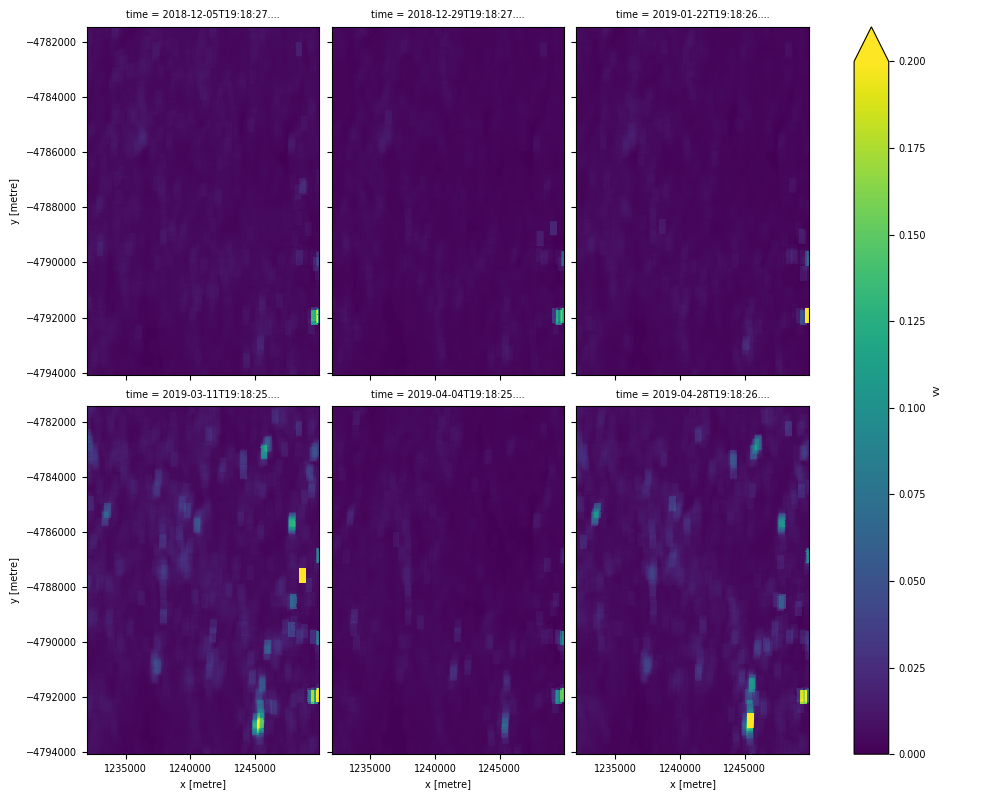

In [18]:
# View smoothed data (Note - you might need to edit 'figsize' to improve appearance)
pylab.rcParams['font.size']=7

ntimes=len(smoothed_range_7x.time.values)
#smoothed_range_7x.vv.isel(time=slice(0,ntimes,2)).plot(col='time',col_wrap=3, vmin=0, vmax=0.2, figsize=(10,8))
smoothed_var_21x.vv.isel(time=slice(0,ntimes,2)).plot(col='time',col_wrap=3, vmin=0, vmax=0.2, figsize=(10,8))

# Approach 1: SAR ratioing - RGB composite
> Red: Average of all SAR images over the period (1st PCA)
> Green: Temporal backscatter change of pre-post fire dates
> Blue: Interferometric coherence of pre-post fire dates

> Adapted from: H.T. Chu, X. Li, L. Ge, & K. Zhang (unknown). Monitoring the 2009 Victorian bushfires with ALOS PALSAR multi-temporal and coherence images. School of Surveying and Spatial Information Systems The University of New South Wales, Sydney. Accessed online from https://pdfs.semanticscholar.org/e672/8d47bfe17b0d4c684219976d942e0a301169.pdf. Accessed on October 18, 2019. 

<IPython.core.display.Javascript object>


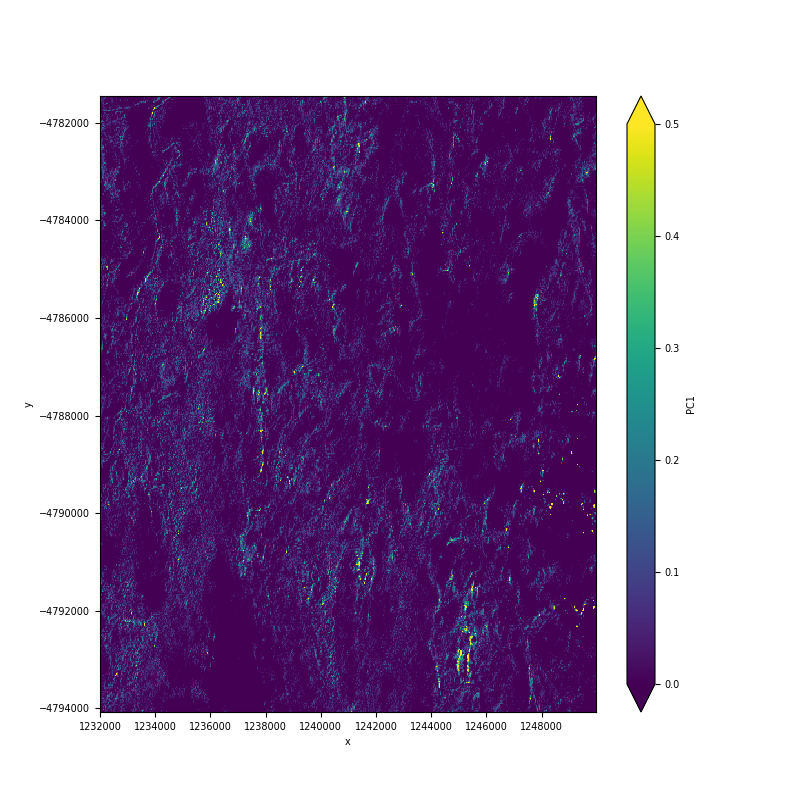

<IPython.core.display.Javascript object>


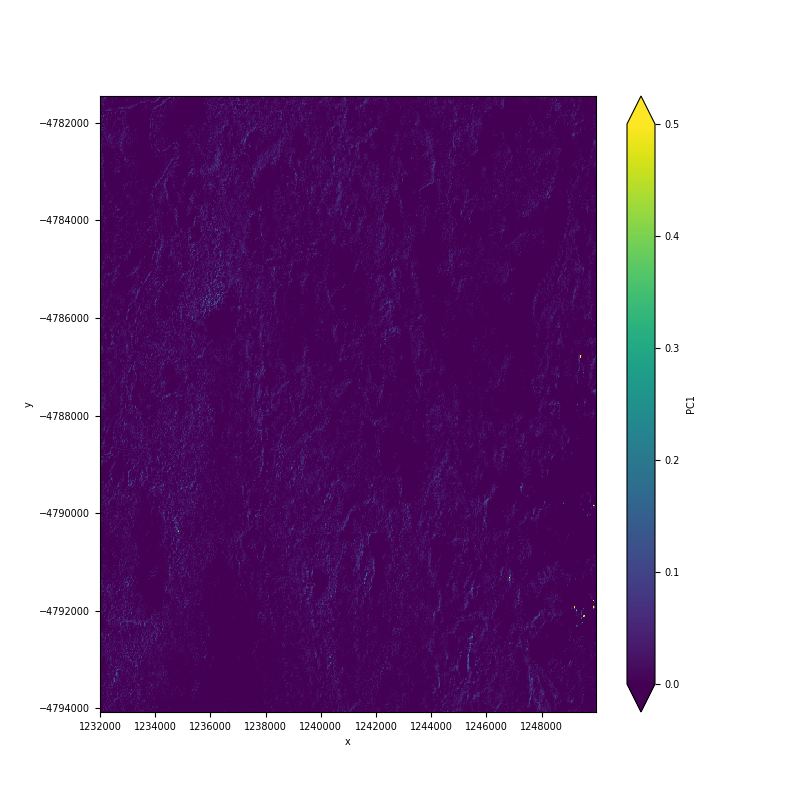

In [19]:
# RED: Calculate first principal component for radar backscatter lee-filtered images
from sklearn.decomposition import PCA
import pandas as pd

# Run on vv images 
smoothed_vv_images = smoothed.vv.sel(time=slice(prefire,postfire))
smoothed_vv_imagesdf = smoothed_vv_images.to_dataframe().unstack('time')
pca = PCA(n_components=1)
pca.fit(smoothed_vv_imagesdf)
X_pca=pca.transform(smoothed_vv_imagesdf) 
smoothed_vv_imagesdf['PC1']=X_pca[:,0]
smoothed_vv_imagesdf=smoothed_vv_imagesdf[['PC1']]
smoothed_vv_pc1 = smoothed_vv_imagesdf['PC1'].to_xarray()

# Run on vh images
smoothed_vh_images = smoothed.vh.sel(time=slice(prefire,postfire))
smoothed_vh_imagesdf = smoothed_vh_images.to_dataframe().unstack('time')
pca2 = PCA(n_components=1)
pca2.fit(smoothed_vh_imagesdf)
X_pca2=pca2.transform(smoothed_vh_imagesdf) 
smoothed_vh_imagesdf['PC1']=X_pca2[:,0]
smoothed_vh_imagesdf=smoothed_vh_imagesdf[['PC1']]
smoothed_vh_pc1 = smoothed_vh_imagesdf['PC1'].to_xarray()

#Plot the principal component images of smoothed vv and vh

smoothed_vv_pc1.plot(col_wrap=1, vmin=0, vmax=0.5, figsize=(8,8))
smoothed_vh_pc1.plot(col_wrap=1, vmin=0, vmax=0.5, figsize=(8,8))

<IPython.core.display.Javascript object>


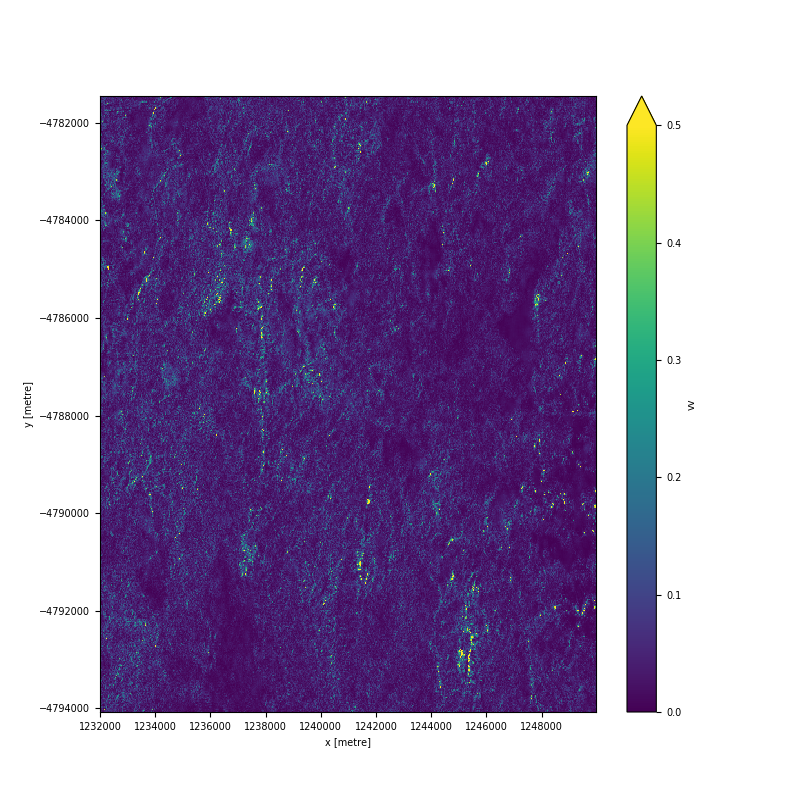

<IPython.core.display.Javascript object>


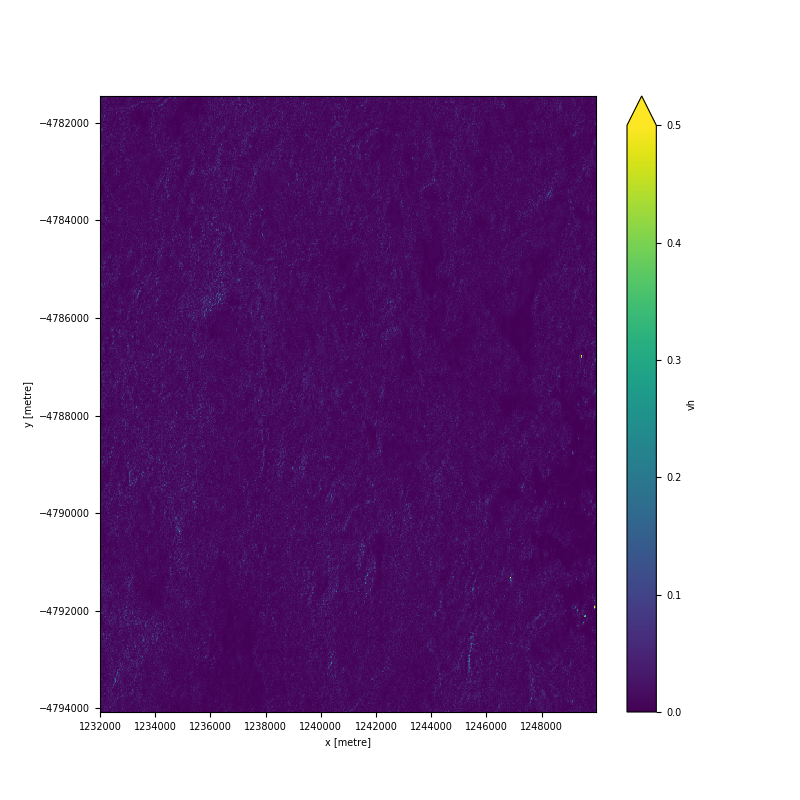

In [20]:
# GREEN: Calculate the temporal backscatter change value (max - min) for radar backscatter lee-filtered images
smoothed_tbc_vv = smoothed.vv.sel(time=slice(prefire,postfire)).max(dim='time') - smoothed.vv.sel(time=slice(prefire,postfire)).min(dim='time')
smoothed_tbc_vh = smoothed.vh.sel(time=slice(prefire,postfire)).max(dim='time') - smoothed.vh.sel(time=slice(prefire,postfire)).min(dim='time')

# Plot tbc ratio images
smoothed_tbc_vv.plot(col_wrap=1, vmin=0, vmax=0.5, figsize=(8,8))
smoothed_tbc_vh.plot(col_wrap=1, vmin=0, vmax=0.5, figsize=(8,8))

In [21]:
# BLUE: Calculate the interferometric coherence change value (max - min) for interferometric coherence lee-filtered images

# Apply lee-filter to interferometric coherence values
smoothed_ic_vv=ic.coh_VV.to_dataset(name='coh_vv')
smoothed_ic_vv=ic.coh_VV.groupby('time').apply(lee_filter, size=7)
smoothed_ic_vh=ic.coh_VH.to_dataset(name='coh_vh')
smoothed_ic_vh=ic.coh_VH.groupby('time').apply(lee_filter, size=7)

# Get image from before Jan 15 which also has the subsequent image prior to Jan 15 (image pairs are 12 days apart) 
# Run ic_clean.time to get the exact dates 
ic_clean.time

<xarray.DataArray 'time' (time: 13)>
array(['2018-12-05T19:18:02.568385000', '2018-12-17T19:18:01.900796000',
       '2018-12-29T19:18:01.619022000', '2019-01-10T19:18:00.983789000',
       '2019-02-15T19:18:00.034403000', '2019-02-27T19:18:24.884347000',
       '2019-03-11T19:17:59.971111000', '2019-03-23T19:18:00.180344000',
       '2019-04-04T19:18:00.427443000', '2019-04-16T19:18:00.717384000',
       '2019-04-28T19:18:01.458499000', '2019-06-15T19:18:28.342946000',
       '2019-06-27T19:18:29.164521000'], dtype='datetime64[ns]')
Coordinates:
  * time     (time) datetime64[ns] 2018-12-05T19:18:02.568385 ... 2019-06-27T19:18:29.164521
Attributes:
    units:    seconds since 1970-01-01 00:00:00

In [22]:
# Set prefire and postfire dates based on the IC dates
ic_prefire = np.datetime64('2018-12-17T19:18:01.900796000')
ic_postfire = np.datetime64('2019-04-16T19:18:00.717384000')

smoothed_ic_firedates = smoothed_ic_vv.sel(time=[ic_prefire,ic_postfire]).to_dataset(name='coh_vv')
smoothed_ic_firedates['coh_vh'] = smoothed_ic_vh.sel(time=[ic_prefire,ic_postfire])

ic_attrs = ic.attrs
smoothed_ic_firedates = smoothed_ic_firedates.assign_attrs(ic_attrs)
smoothed_ic_firedates

# Calculate ratio image (max - min) using the prefire and postfire IC images in VV and VH
smoothed_ic_vv_ratioed = smoothed_ic_firedates.coh_vv.max(dim='time') - smoothed_ic_firedates.coh_vv.min(dim='time')
smoothed_ic_vh_ratioed = smoothed_ic_firedates.coh_vh.max(dim='time') - smoothed_ic_firedates.coh_vh.min(dim='time')

<IPython.core.display.Javascript object>


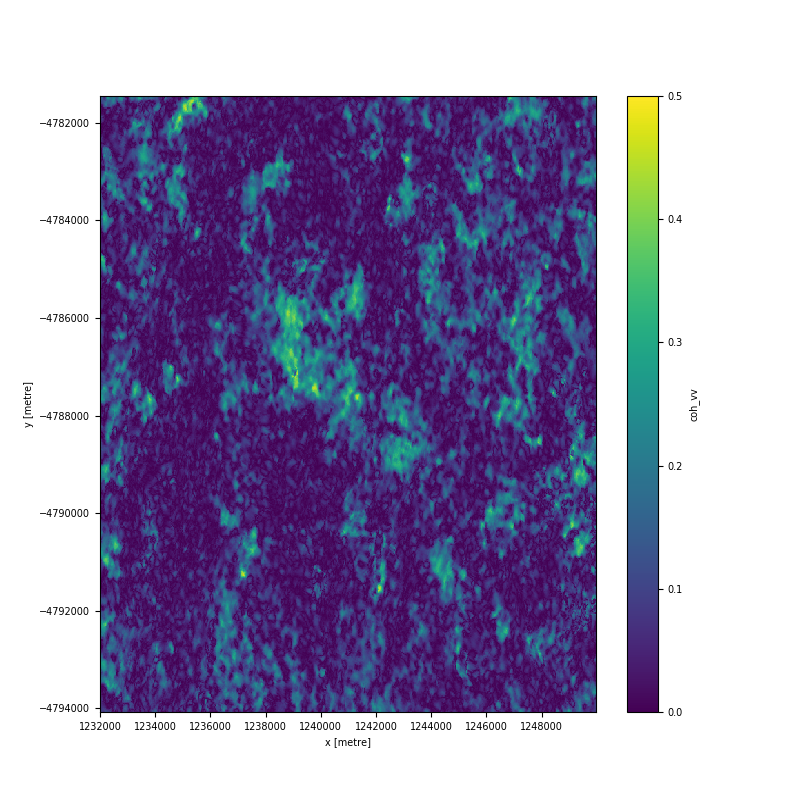

In [23]:
# Plot smoothed IC VV image
smoothed_ic_vv_ratioed.plot(col_wrap=1, vmin=0, vmax=0.5, figsize=(8,8))

<IPython.core.display.Javascript object>


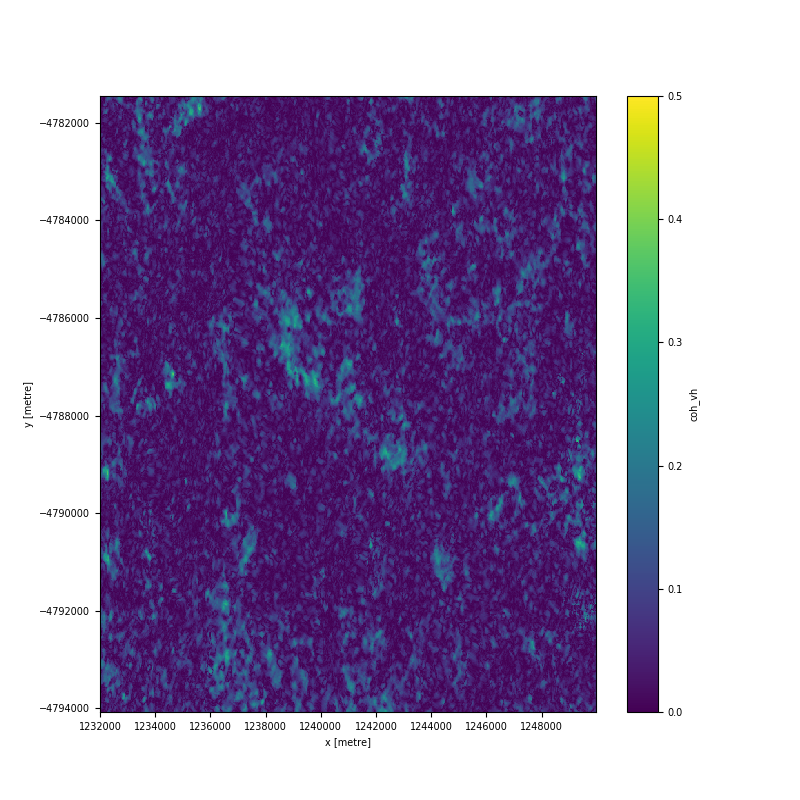

In [24]:
# Plot smoothed IC VH image
smoothed_ic_vh_ratioed.plot(col_wrap=1, vmin=0, vmax=0.5, figsize=(8,8))

<IPython.core.display.Javascript object>


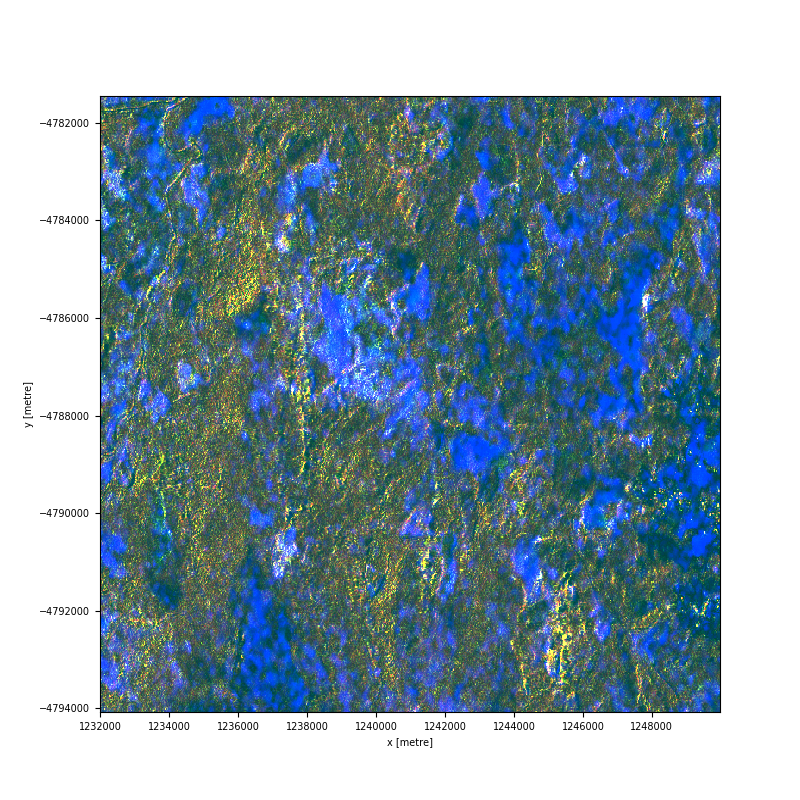

In [25]:
# Generate composite images for vv and vh

# RGB composite for vv
sar_ratio_rgb_vv=smoothed_vv_pc1.to_dataset(name='red')
sar_ratio_rgb_vv['green']=smoothed_tbc_vv
sar_ratio_rgb_vv['blue']=smoothed_ic_vv_ratioed

# Plot RGB
sar_ratio_rgb_vv[['red', 'green', 'blue']].to_array().plot.imshow(robust=True, figsize=(8, 8))

<IPython.core.display.Javascript object>


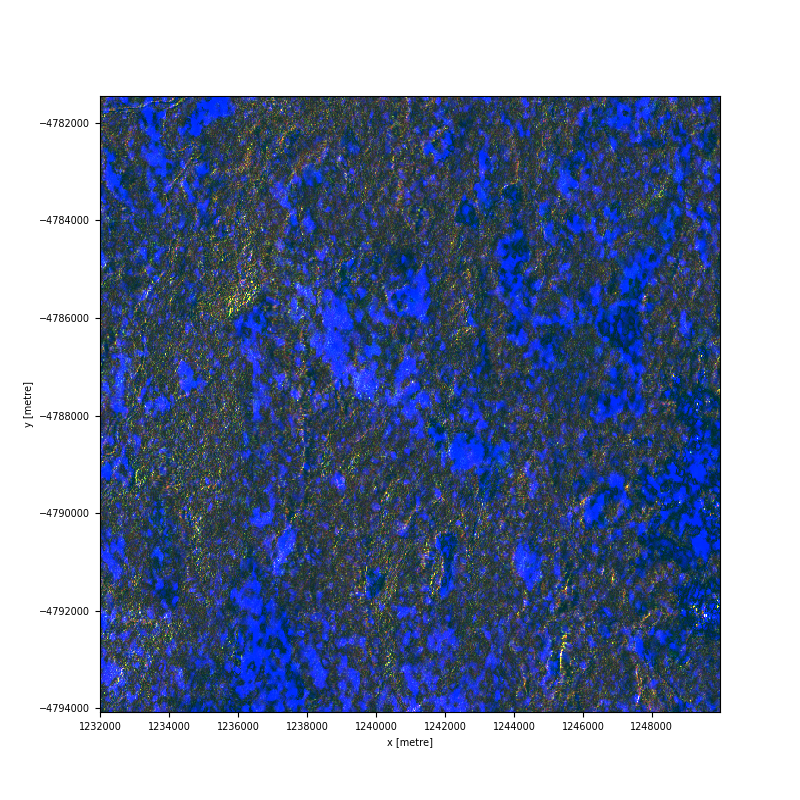

In [26]:
# RGB composite for vh
sar_ratio_rgb_vh=smoothed_vh_pc1.to_dataset(name='red')
sar_ratio_rgb_vh['green']=smoothed_tbc_vh
sar_ratio_rgb_vh['blue']=smoothed_ic_vh_ratioed

# Plot RGB
sar_ratio_rgb_vh[['red', 'green', 'blue']].to_array().plot.imshow(robust=True, figsize=(8, 8))

# Approach 2: Speckle and Texture Combined using Range
> Red: Range texture filter with a 7x7 kernel of pre- and post-fire image then ratioed (max-min)
> Green: Lee speckle remove filter with a 7x7 kernel of pre- and post-fire image then ratioed (max-min)
> Blue:  Range texture filter with a 21x21 kernel of pre- and post-fire image then ratioed (max-min) 

In [27]:
# RED: Range texture filter with a 7x7 kernel of pre- and post-fire image then ratioed (max-min)

range_filter_7x_firedates = smoothed_range_7x.vv.sel(time=[prefire,postfire]).to_dataset(name='vv')
range_filter_7x_firedates['vh'] = smoothed_range_7x.vh.sel(time=[prefire,postfire])

# Apply the zero values mask
range_filter_7x_firedates = range_filter_7x_firedates.where(~nodata_mask)

smoothed_range_7x_attrs = smoothed_range_7x.attrs
range_filter_7x_firedates = range_filter_7x_firedates.assign_attrs(smoothed_range_7x_attrs)

# Calculate ratio image (max - min) using the prefire and postfire IC images in VV and VH
range_filter_7x_vv_ratioed = range_filter_7x_firedates.vv.max(dim='time') - range_filter_7x_firedates.vv.min(dim='time')
range_filter_7x_vh_ratioed = range_filter_7x_firedates.vh.max(dim='time') - range_filter_7x_firedates.vh.min(dim='time')

<IPython.core.display.Javascript object>


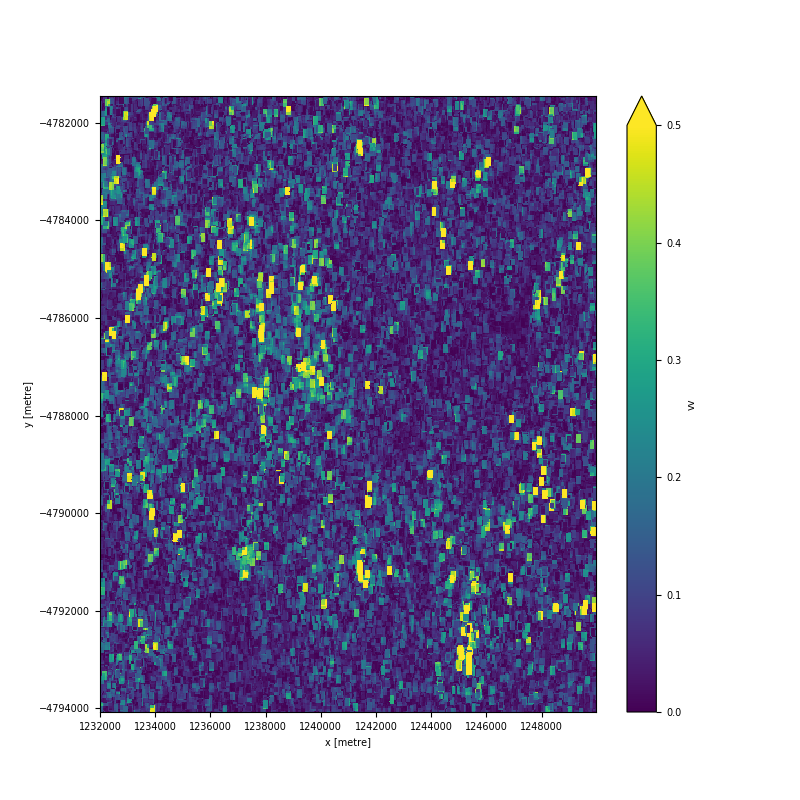

In [28]:
# Plot range filtered VV image
range_filter_7x_vv_ratioed.plot(col_wrap=1, vmin=0, vmax=0.5, figsize=(8,8))

In [29]:
# GREEN: Lee speckle remove filter with a 7x7 kernel of pre- and post-fire image then ratioed (max-min)

smooth_filter_7x_firedates = smoothed.vv.sel(time=[prefire,postfire]).to_dataset(name='vv')
smooth_filter_7x_firedates['vh'] = smoothed.vh.sel(time=[prefire,postfire])

# Apply the zero values mask
smooth_filter_7x_firedates = smooth_filter_7x_firedates.where(~nodata_mask)

smooth_attrs = smoothed.attrs
smooth_filter_7x_firedates = smooth_filter_7x_firedates.assign_attrs(smooth_attrs)

# Calculate ratio image (max - min) using the prefire and postfire IC images in VV and VH
smooth_filter_7x_vv_ratioed = smooth_filter_7x_firedates.vv.max(dim='time') - smooth_filter_7x_firedates.vv.min(dim='time')
smooth_filter_7x_vh_ratioed = smooth_filter_7x_firedates.vh.max(dim='time') - smooth_filter_7x_firedates.vh.min(dim='time')


<IPython.core.display.Javascript object>


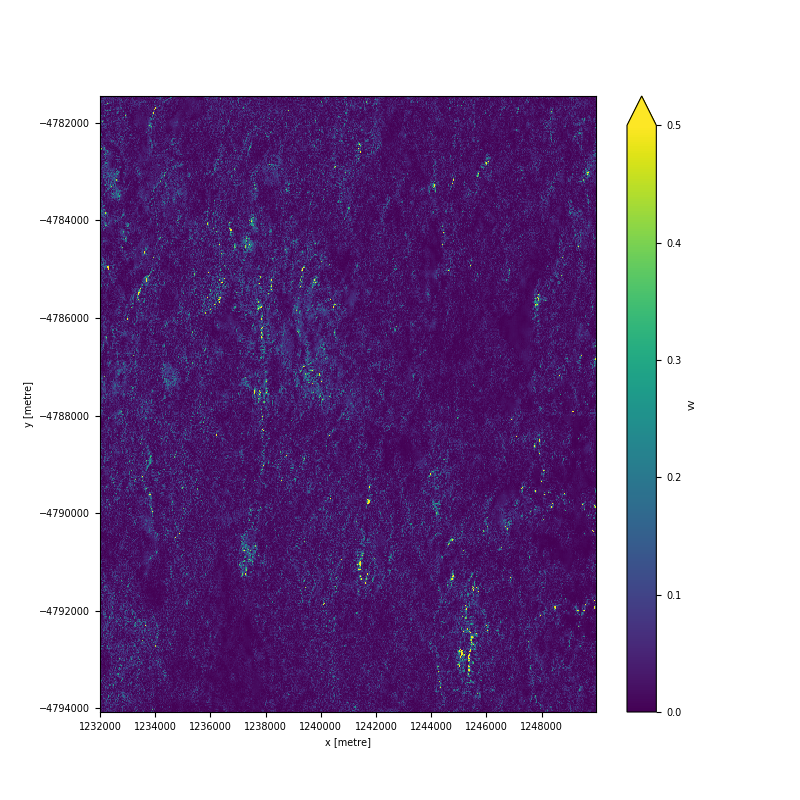

In [30]:
# Plot smooth filtered VV image
smooth_filter_7x_vv_ratioed.plot(col_wrap=1, vmin=0, vmax=0.5, figsize=(8,8))

In [31]:
# BLUE: Range texture filter with a 21x21 kernel of pre- and post-fire image then ratioed (max-min)

range_filter_21x_firedates = smoothed_range_21x.vv.sel(time=[prefire,postfire]).to_dataset(name='vv')
range_filter_21x_firedates['vh'] = smoothed_range_21x.vh.sel(time=[prefire,postfire])

# Apply the zero values mask
range_filter_21x_firedates = range_filter_21x_firedates.where(~nodata_mask)

smoothed_range_21x_attrs = smoothed_range_21x.attrs
range_filter_21x_firedates = range_filter_21x_firedates.assign_attrs(smoothed_range_21x_attrs)

# Calculate ratio image (max - min) using the prefire and postfire IC images in VV and VH
range_filter_21x_vv_ratioed = range_filter_21x_firedates.vv.max(dim='time') - range_filter_21x_firedates.vv.min(dim='time')
range_filter_21x_vh_ratioed = range_filter_21x_firedates.vh.max(dim='time') - range_filter_21x_firedates.vh.min(dim='time')

<IPython.core.display.Javascript object>


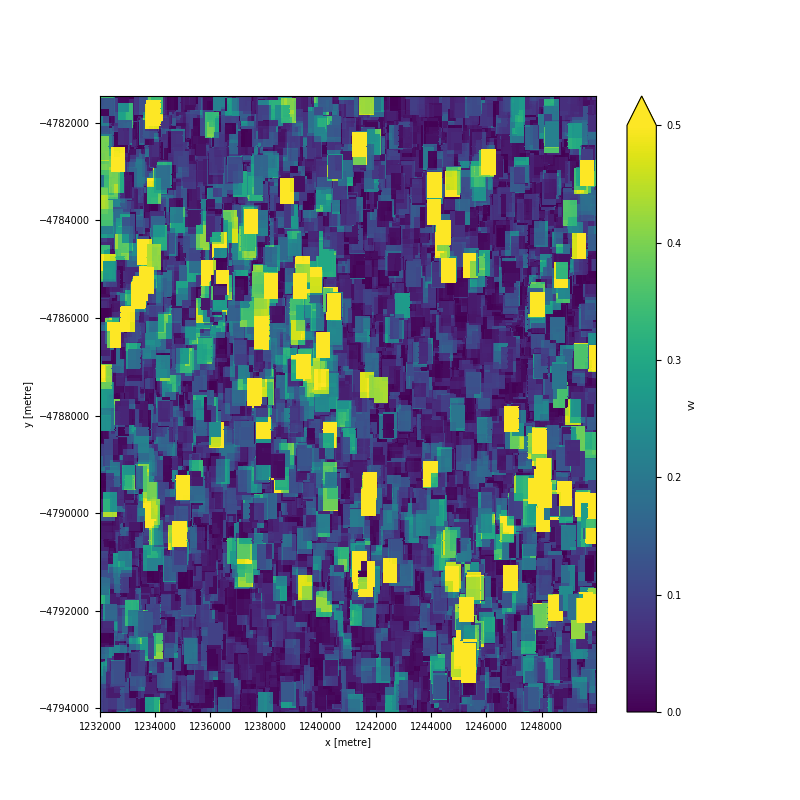

In [32]:
# Plot range filtered VV image
range_filter_21x_vv_ratioed.plot(col_wrap=1, vmin=0, vmax=0.5, figsize=(8,8))

<IPython.core.display.Javascript object>


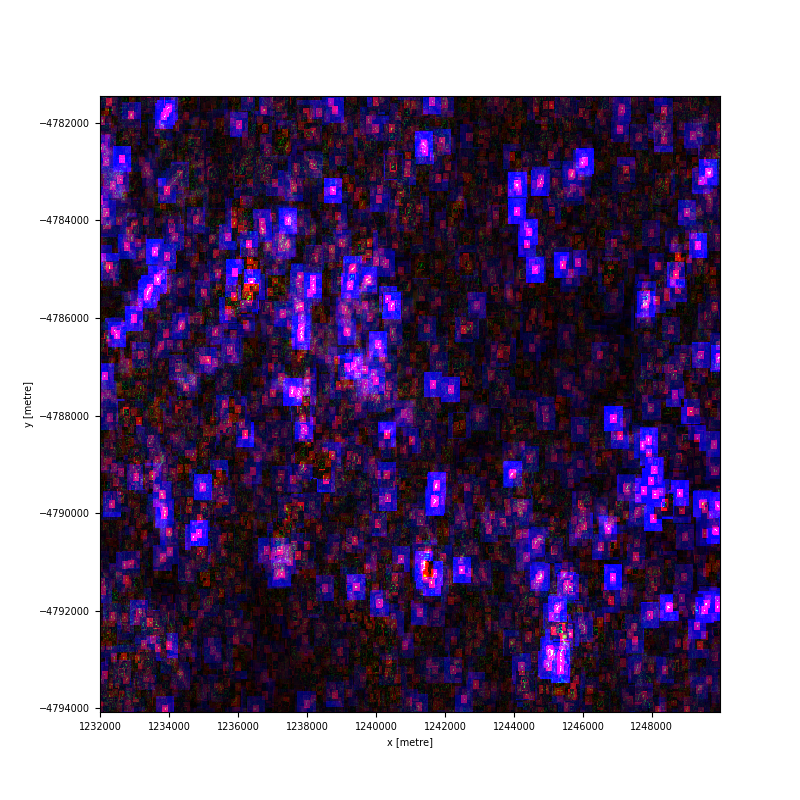

In [33]:
# Generate composite images for vv and vh

# RGB composite for vv
range_ratio_rgb_vv=range_filter_7x_vv_ratioed.to_dataset(name='red')
range_ratio_rgb_vv['green']=smooth_filter_7x_vv_ratioed
range_ratio_rgb_vv['blue']=range_filter_21x_vv_ratioed

# Plot RGB
range_ratio_rgb_vv[['red', 'green', 'blue']].to_array().plot.imshow(robust=True, figsize=(8, 8))

<IPython.core.display.Javascript object>


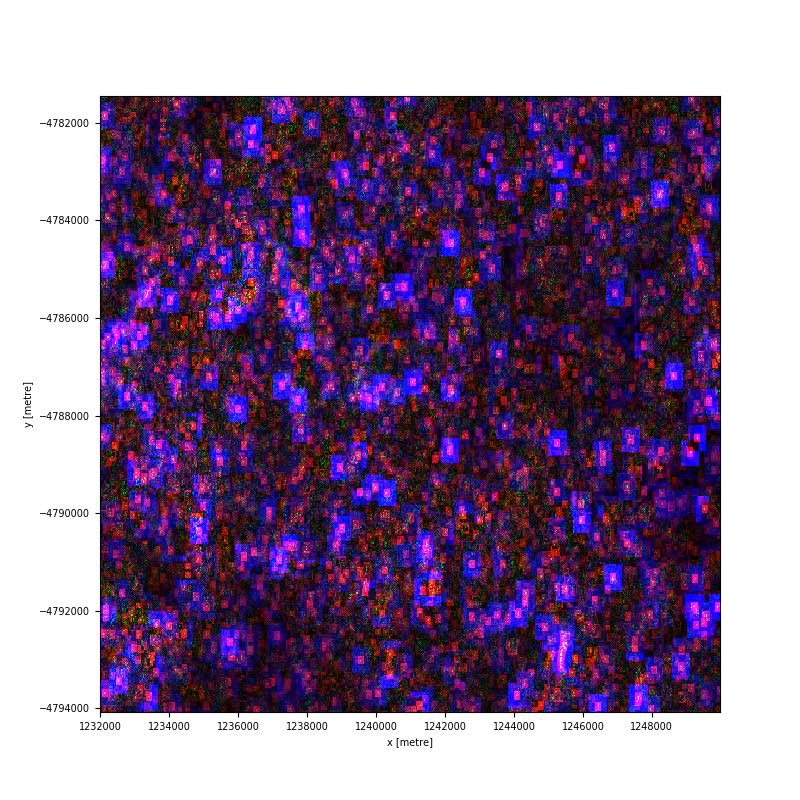

In [34]:
# RGB composite for vh
range_ratio_rgb_vh=range_filter_7x_vh_ratioed.to_dataset(name='red')
range_ratio_rgb_vh['green']=smooth_filter_7x_vh_ratioed
range_ratio_rgb_vh['blue']=range_filter_21x_vh_ratioed

# Plot RGB
range_ratio_rgb_vh[['red', 'green', 'blue']].to_array().plot.imshow(robust=True, figsize=(8, 8))

# Approach 3: Speckle and Texture Combined using Variance
> Red: Variance texture filter with a 7x7 kernel of pre- and post-fire image then ratioed (max-min)
> Green: Lee speckle remove filter with a 7x7 kernel of pre- and post-fire image then ratioed (max-min)
> Blue:  Variance texture filter with a 21x21 kernel of pre- and post-fire image then ratioed (max-min) 

In [35]:
# RED: Variance texture filter with a 7x7 kernel of pre- and post-fire image then ratioed (max-min)

var_filter_7x_firedates = smoothed_var_7x.vv.sel(time=[prefire,postfire]).to_dataset(name='vv')
var_filter_7x_firedates['vh'] = smoothed_var_7x.vh.sel(time=[prefire,postfire])

# Apply the zero values mask
var_filter_7x_firedates = var_filter_7x_firedates.where(~nodata_mask)

smoothed_var_7x_attrs = smoothed_var_7x.attrs
var_filter_7x_firedates = var_filter_7x_firedates.assign_attrs(smoothed_var_7x_attrs)

# Calculate ratio image (max - min) using the prefire and postfire IC images in VV and VH
var_filter_7x_vv_ratioed = var_filter_7x_firedates.vv.max(dim='time') - var_filter_7x_firedates.vv.min(dim='time')
var_filter_7x_vh_ratioed = var_filter_7x_firedates.vh.max(dim='time') - var_filter_7x_firedates.vh.min(dim='time')

<IPython.core.display.Javascript object>


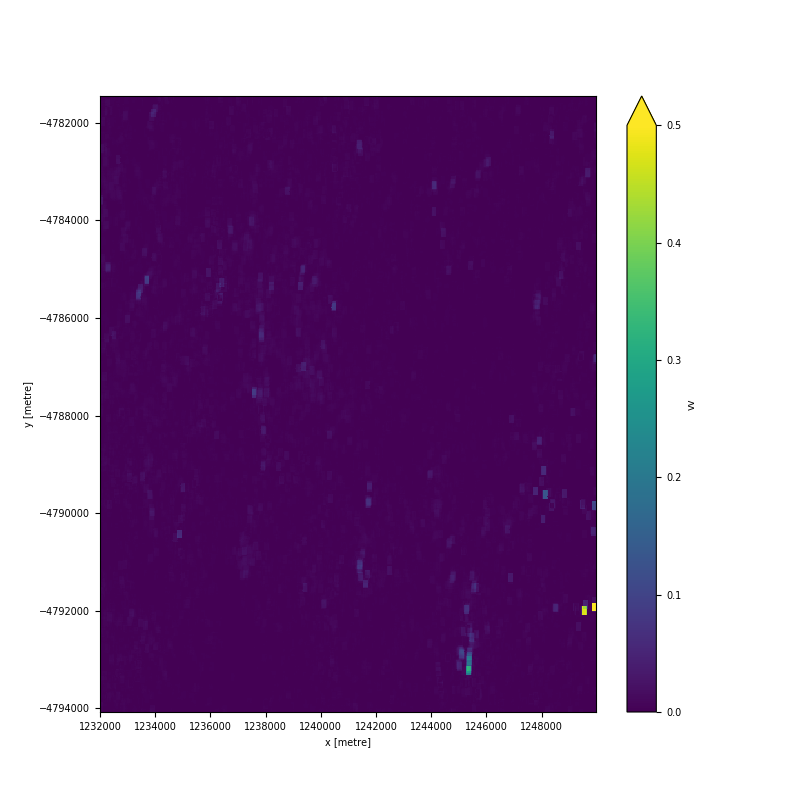

In [36]:
# Plot variance filtered VV image
var_filter_7x_vv_ratioed.plot(col_wrap=1, vmin=0, vmax=0.5, figsize=(8,8))

In [37]:
# GREEN: Lee speckle remove filter with a 7x7 kernel of pre- and post-fire image then ratioed (max-min)

smooth_filter_7x_firedates = smoothed.vv.sel(time=[prefire,postfire]).to_dataset(name='vv')
smooth_filter_7x_firedates['vh'] = smoothed.vh.sel(time=[prefire,postfire])

# Apply the zero values mask
smooth_filter_7x_firedates = smooth_filter_7x_firedates.where(~nodata_mask)

smooth_attrs = smoothed.attrs
smooth_filter_7x_firedates = smooth_filter_7x_firedates.assign_attrs(smooth_attrs)

# Calculate ratio image (max - min) using the prefire and postfire IC images in VV and VH
smooth_filter_7x_vv_ratioed = smooth_filter_7x_firedates.vv.max(dim='time') - smooth_filter_7x_firedates.vv.min(dim='time')
smooth_filter_7x_vh_ratioed = smooth_filter_7x_firedates.vh.max(dim='time') - smooth_filter_7x_firedates.vh.min(dim='time')


In [38]:
# BLUE: Variance texture filter with a 21x21 kernel of pre- and post-fire image then ratioed (max-min) 

var_filter_21x_firedates = smoothed_var_21x.vv.sel(time=[prefire,postfire]).to_dataset(name='vv')
var_filter_21x_firedates['vh'] = smoothed_var_21x.vh.sel(time=[prefire,postfire])

# Apply the zero values mask
var_filter_21x_firedates = var_filter_21x_firedates.where(~nodata_mask)

smoothed_var_21x_attrs = smoothed_var_21x.attrs
var_filter_21x_firedates = var_filter_21x_firedates.assign_attrs(smoothed_var_21x_attrs)

# Calculate ratio image (max - min) using the prefire and postfire IC images in VV and VH
var_filter_21x_vv_ratioed = var_filter_21x_firedates.vv.max(dim='time') - var_filter_21x_firedates.vv.min(dim='time')
var_filter_21x_vh_ratioed = var_filter_21x_firedates.vh.max(dim='time') - var_filter_21x_firedates.vh.min(dim='time')

<IPython.core.display.Javascript object>


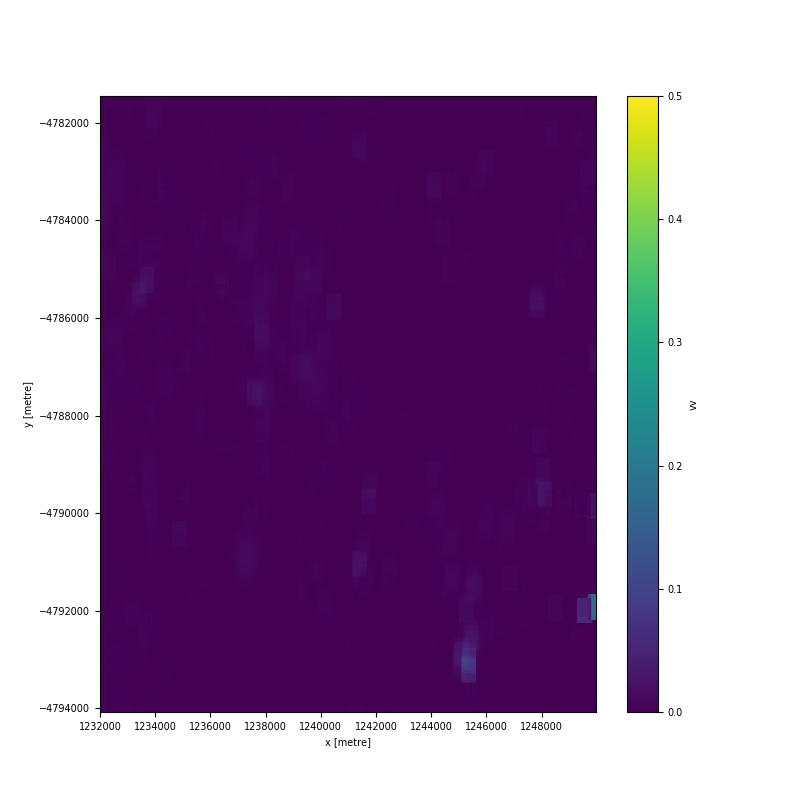

In [39]:
# Plot variance filtered VV image
var_filter_21x_vv_ratioed.plot(col_wrap=1, vmin=0, vmax=0.5, figsize=(8,8))

<IPython.core.display.Javascript object>


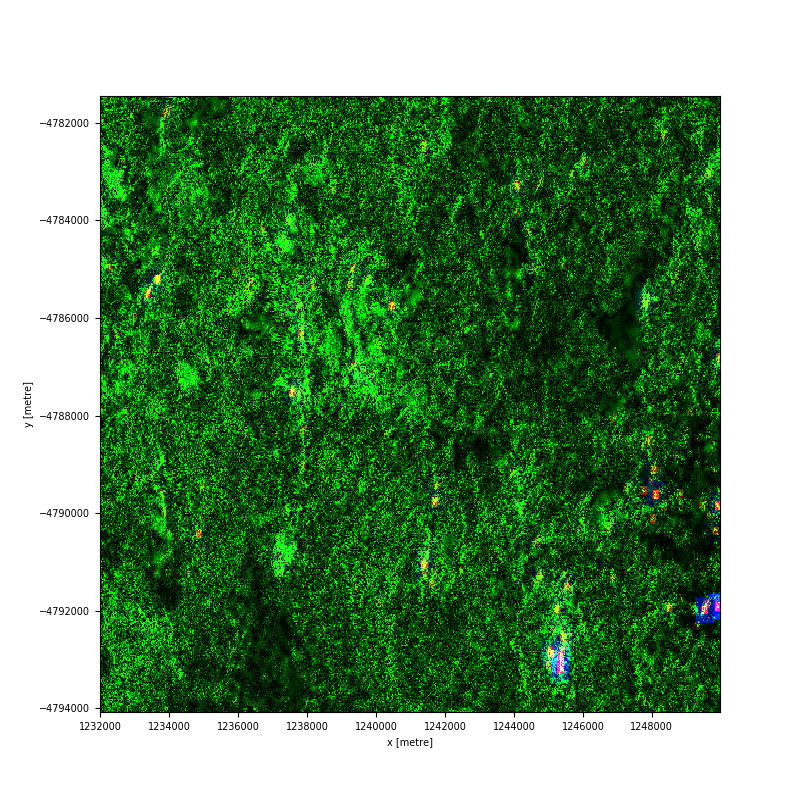

In [40]:
# Generate composite images for vv and vh

# RGB composite for vv
variance_ratio_rgb_vv=var_filter_7x_vv_ratioed.to_dataset(name='red')
variance_ratio_rgb_vv['green']=smooth_filter_7x_vv_ratioed
variance_ratio_rgb_vv['blue']=var_filter_21x_vv_ratioed

# Plot RGB
variance_ratio_rgb_vv[['red', 'green', 'blue']].to_array().plot.imshow(robust=True, figsize=(8, 8))

<IPython.core.display.Javascript object>


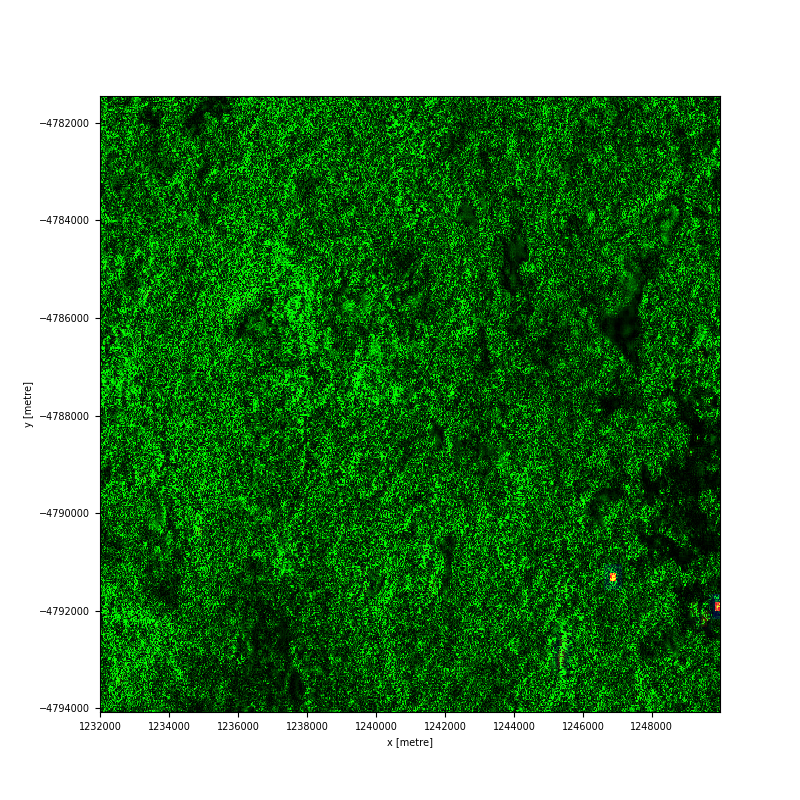

In [41]:
# RGB composite for vh
variance_ratio_rgb_vh=var_filter_7x_vh_ratioed.to_dataset(name='red')
variance_ratio_rgb_vh['green']=smooth_filter_7x_vh_ratioed
variance_ratio_rgb_vh['blue']=var_filter_21x_vh_ratioed

# Plot RGB
variance_ratio_rgb_vh[['red', 'green', 'blue']].to_array().plot.imshow(robust=True, figsize=(8, 8))

# Approach 4: Optical only
> Three images (pre-, during-, and post-fire) were acquired for the fire region using a 
> combination of four bands:
> Red: Band 4 (RED)
> Green: Band 8 (Near Infrared - NIR)
> Blue: Band 11 and 12 (Shortwave Infrared - SWIR) included as a mid-infrared burned index (MIBI)

> MIBI is calculated as:
> MIBI = 10*SWIR12 - 9.8*SWIR11 + 2

> This equation is taken from E. Roteta, A. Bastarrika, M. Padilla, T. Storm, E. Chuvieco (2019). Development of a Sentinel-2 burned area algorithm: Generation of a small fire database for sub-Saharan Africa,
Remote Sensing of Environment, Volume 222, p1-17. https://doi.org/10.1016/j.rse.2018.12.011.

> Images were downloaded from the datacube as ard_granule product (analysis ready data) synonymous with the level2a product (bottom Of Atmosphere (BOA) reflectance images). Images between the fire dates were observed and selected for minimal cloud cover over the fire area.

In [42]:
# Load Sentinel-2 to extract pre-, during-, and post-fire optical images 
dc_S2 = datacube.Datacube(app='dc-S2-extract')

In [43]:
#dc_S2.list_products()

In [44]:
# Read S2 red, nir, swir and cloud mask bands for S2a and S2b
bands_of_interest = ['nbar_red','nbar_nir_1','nbar_swir_2', 'nbar_swir_3', 'fmask']
sensors = ['s2a','s2b']

s2 = {}
for sensor in sensors:
    #s2[sensor] = dc_S2.load(product = sensor+'_ard_granule', group_by='solar_day', measurements = bands_of_interest, **query)
    s2[sensor] = dc_S2.load(product = sensor+'_ard_granule', group_by='solar_day', measurements = bands_of_interest, **query)
s2

{'s2a': <xarray.Dataset>
 Dimensions:      (time: 20, x: 719, y: 505)
 Coordinates:
   * time         (time) datetime64[ns] 2018-12-06T00:02:31.024000 ... 2019-06-24T00:02:41.024000
   * y            (y) float64 -4.794e+06 -4.794e+06 ... -4.781e+06 -4.781e+06
   * x            (x) float64 1.25e+06 1.25e+06 1.25e+06 ... 1.232e+06 1.232e+06
 Data variables:
     nbar_red     (time, y, x) int16 203 196 216 201 190 ... 1680 1597 1751 2164
     nbar_nir_1   (time, y, x) int16 2619 2483 2447 2482 ... 2449 2276 2443 2866
     nbar_swir_2  (time, y, x) int16 826 876 881 892 855 ... 2443 2450 2890 2855
     nbar_swir_3  (time, y, x) int16 313 342 343 351 339 ... 2081 2100 2557 2442
     fmask        (time, y, x) uint8 1 1 1 1 1 1 1 1 1 1 ... 2 2 2 2 2 2 2 2 2 2
 Attributes:
     crs:      EPSG:3577, 's2b': <xarray.Dataset>
 Dimensions:      (time: 21, x: 719, y: 505)
 Coordinates:
   * time         (time) datetime64[ns] 2018-12-01T00:02:39.024000 ... 2019-06-29T00:02:49.024000
   * y           

In [45]:
# Combine the S2a and S2b dates
s2_clean = xr.concat(s2.values(), dim='time')

del s2

<IPython.core.display.Javascript object>


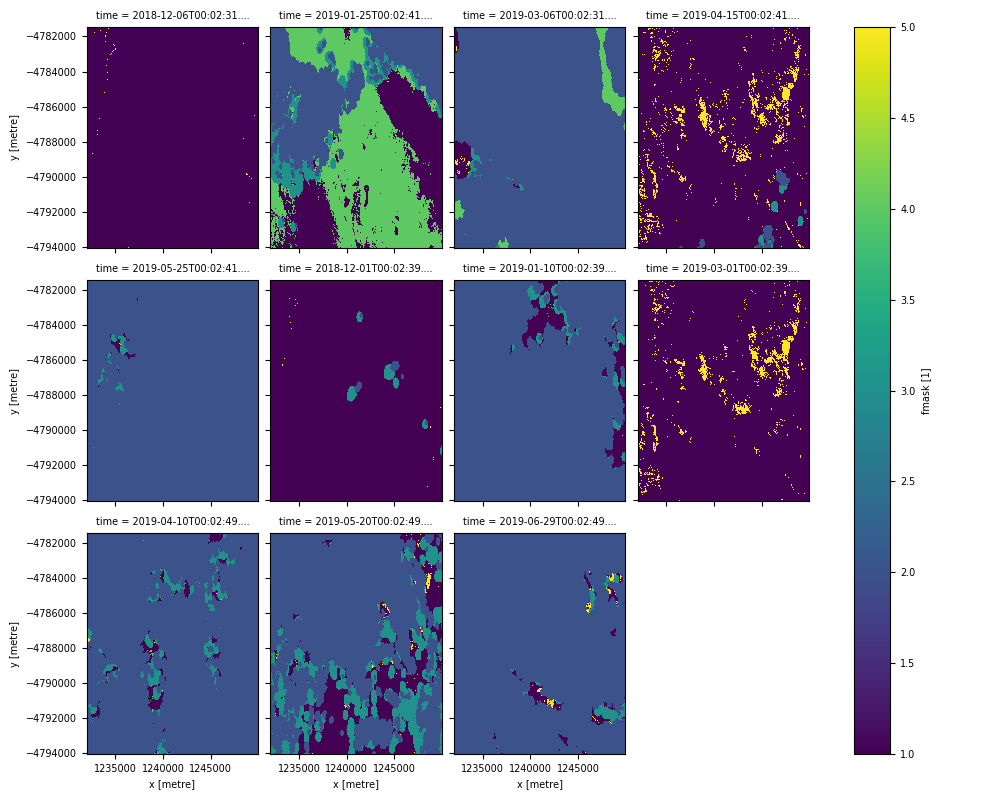

In [46]:
# View the S2 fmask
ntimes=len(s2_clean.time.values)
s2_clean.fmask.isel(time=slice(0,ntimes,4)).plot(col='time', col_wrap=4, figsize=(10,8))

In [47]:
# Remove clouds and nulls from S2 data
nbar_red = s2_clean.nbar_red
s2_good=nbar_red.to_dataset(name='red')
s2_good['nir']=s2_clean.nbar_nir_1
s2_good['swir11']=s2_clean.nbar_swir_2
s2_good['swir12']=s2_clean.nbar_swir_3
s2_good['fmask']=s2_clean.fmask

s2_good_temp = s2_good.where(s2_good.fmask<2) # to remove cloud/shadow/nulls based on fmask
s2_good_temp2 = s2_good_temp.where(s2_good_temp.fmask!=0)

total_px=len(s2_good_temp2.x)*len(s2_good_temp2.y)
valid=s2_good_temp2.where(s2_good_temp2.fmask!=0).count(dim=('x','y'))

good=(valid.red/total_px)>0.5

s2_good_clean = s2_good_temp2.sel(time=good)
del s2_good, s2_good_temp, s2_good_temp2

s2_good_clean = s2_good_clean.assign_attrs(bs_attrs)

s2_good_clean

<xarray.Dataset>
Dimensions:  (time: 10, x: 719, y: 505)
Coordinates:
  * y        (y) float64 -4.794e+06 -4.794e+06 ... -4.781e+06 -4.781e+06
  * x        (x) float64 1.25e+06 1.25e+06 1.25e+06 ... 1.232e+06 1.232e+06
  * time     (time) datetime64[ns] 2018-12-06T00:02:31.024000 ... 2019-03-01T00:02:39.024000
Data variables:
    red      (time, y, x) float64 203.0 196.0 216.0 201.0 ... 437.0 422.0 497.0
    nir      (time, y, x) float64 2.619e+03 2.483e+03 ... 1.288e+03 1.414e+03
    swir11   (time, y, x) float64 826.0 876.0 881.0 ... 1.252e+03 1.225e+03
    swir12   (time, y, x) float64 313.0 342.0 343.0 351.0 ... 625.0 668.0 628.0
    fmask    (time, y, x) float64 1.0 1.0 1.0 1.0 1.0 ... 1.0 1.0 1.0 1.0 1.0
Attributes:
    crs:      EPSG:3577

In [48]:
# List all the dates in order for the cleaned images to select dates below
s2_good_clean.coords['time'].sortby('time')

<xarray.DataArray 'time' (time: 10)>
array(['2018-12-01T00:02:39.024000000', '2018-12-06T00:02:31.024000000',
       '2018-12-11T00:02:39.024000000', '2018-12-26T00:02:31.024000000',
       '2018-12-31T00:02:39.024000000', '2019-02-24T00:02:41.024000000',
       '2019-03-01T00:02:39.024000000', '2019-03-16T00:02:41.024000000',
       '2019-04-05T00:02:41.024000000', '2019-04-15T00:02:41.024000000'],
      dtype='datetime64[ns]')
Coordinates:
  * time     (time) datetime64[ns] 2018-12-01T00:02:39.024000 ... 2019-04-15T00:02:41.024000
Attributes:
    units:    seconds since 1970-01-01 00:00:00

In [49]:
# set dates 
# Riveaux Road
op_prefire = np.datetime64('2018-12-31T00:02:39.024000000') # 20181231 2B
op_midfire = np.datetime64('2019-02-24T00:02:41.024000000') # 20190224 2A
op_postfire = np.datetime64('2019-04-15T00:02:41.024000000') # 20190415 2A


# Moores Valley
#op_prefire = np.datetime64('') # 20190113 2B
#op_midfire = np.datetime64('') # 20190202 2B
#op_postfire = np.datetime64('') # No clear enough images after the fire within a few months 

# Great Pine Tier
#op_prefire = np.datetime64('') # 20190113 2B
#op_midfire = np.datetime64('') # 20190224 2A
#op_postfire = np.datetime64('') # 20190316 2A

In [50]:
# Select only the images needed
s2_good_clean_firedates = s2_good_clean.sel(time=[op_prefire,op_midfire,op_postfire])

In [51]:
# A function that calculates mid-infrared burned index (MIBI) 
def mibi(da):
    swirband11 = da.swir11.astype(float)
    swirband12 = da.swir12.astype(float)
    img_mibi = 10*swirband12 - 9.8*swirband11 + 2
    return img_mibi

In [52]:
# Create MIBI band for firedates
s2_good_clean_firedates['mibi']=s2_good_clean_firedates.groupby('time').apply(mibi)
s2_good_clean_firedates

<xarray.Dataset>
Dimensions:  (time: 3, x: 719, y: 505)
Coordinates:
  * y        (y) float64 -4.794e+06 -4.794e+06 ... -4.781e+06 -4.781e+06
  * x        (x) float64 1.25e+06 1.25e+06 1.25e+06 ... 1.232e+06 1.232e+06
  * time     (time) datetime64[ns] 2018-12-31T00:02:39.024000 ... 2019-04-15T00:02:41.024000
Data variables:
    red      (time, y, x) float64 228.0 201.0 219.0 223.0 ... 325.0 318.0 376.0
    nir      (time, y, x) float64 2.68e+03 2.546e+03 ... 1.148e+03 1.025e+03
    swir11   (time, y, x) float64 771.0 794.0 792.0 ... 929.0 1.095e+03 1.01e+03
    swir12   (time, y, x) float64 295.0 311.0 320.0 334.0 ... 484.0 586.0 521.0
    fmask    (time, y, x) float64 1.0 1.0 1.0 1.0 1.0 ... 1.0 1.0 1.0 1.0 1.0
    mibi     (time, y, x) float64 -4.604e+03 -4.669e+03 ... -4.686e+03
Attributes:
    crs:      EPSG:3577

<IPython.core.display.Javascript object>


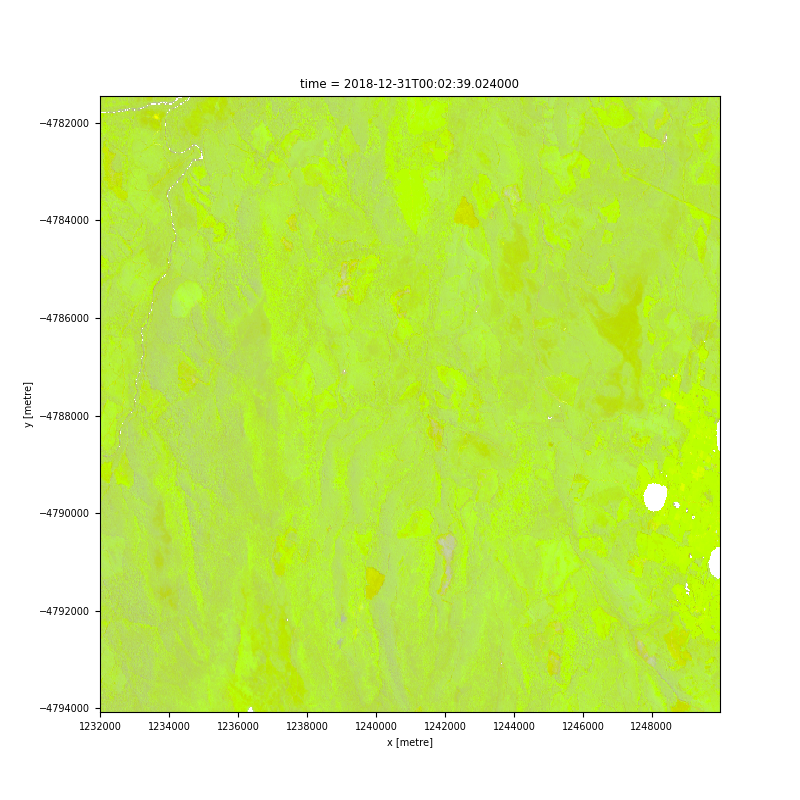

In [53]:
# Generate composite images for prefire, midfire, and postfire dates using 
# RED = band 4 (red)
# GREEN = band 8 (nir)
# BLUE = MIBI

# RGB composite for prefire
prefire_optical_img = s2_good_clean_firedates.sel(time=[op_prefire])
prefire_optical_img = prefire_optical_img.squeeze('time')
prefire_optical_rgb=prefire_optical_img.red.to_dataset(name='red')
prefire_optical_rgb['green']=prefire_optical_img.nir
prefire_optical_rgb['blue']=prefire_optical_img.mibi
prefire_optical_rgb = prefire_optical_rgb.assign_attrs(bs_attrs)

# Plot RGB
prefire_optical_rgb[['red', 'green', 'blue']].to_array().plot.imshow(robust=True, figsize=(8, 8))

/g/data/v10/public/modules/dea-env/20190709/lib/python3.6/site-packages/xarray/plot/utils.py:364: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  _, ax = plt.subplots(figsize=figsize)


<IPython.core.display.Javascript object>


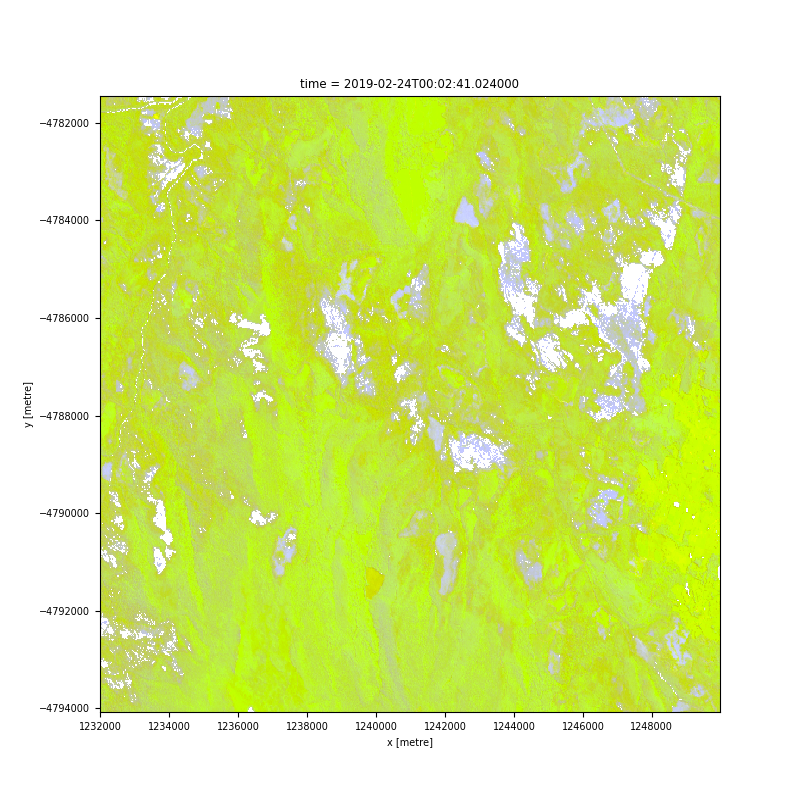

In [54]:
# RGB composite for midfire
midfire_optical_img = s2_good_clean_firedates.sel(time=[op_midfire])
midfire_optical_img = midfire_optical_img.squeeze('time')
midfire_optical_rgb=midfire_optical_img.red.to_dataset(name='red')
midfire_optical_rgb['green']=midfire_optical_img.nir
midfire_optical_rgb['blue']=midfire_optical_img.mibi
midfire_optical_rgb = midfire_optical_rgb.assign_attrs(bs_attrs)

# Plot RGB
midfire_optical_rgb[['red', 'green', 'blue']].to_array().plot.imshow(robust=True, figsize=(8, 8))

/g/data/v10/public/modules/dea-env/20190709/lib/python3.6/site-packages/xarray/plot/utils.py:364: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  _, ax = plt.subplots(figsize=figsize)


<IPython.core.display.Javascript object>


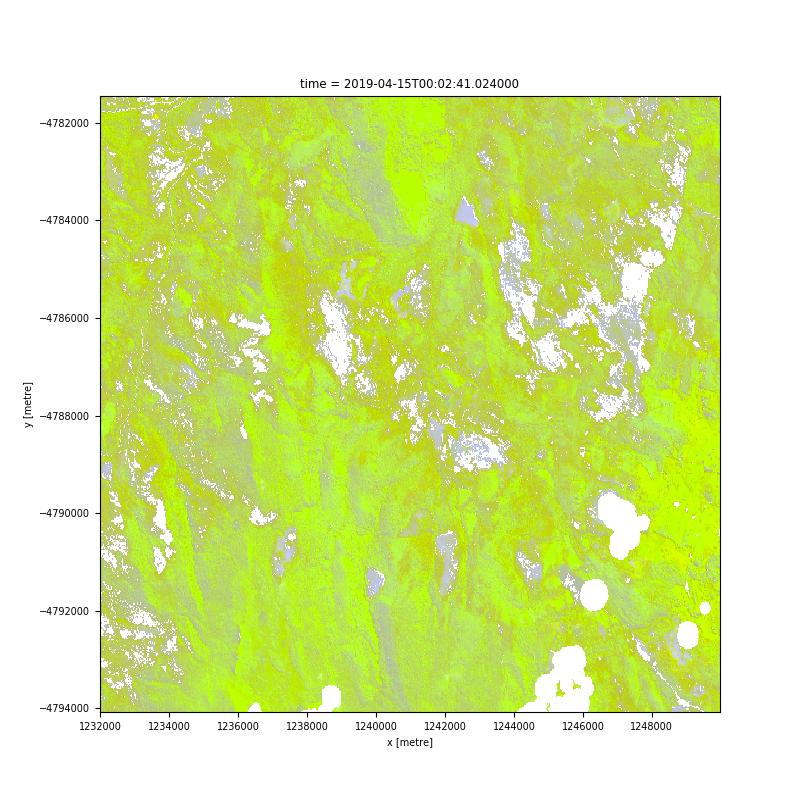

In [55]:
# RGB composite for postfire
postfire_optical_img = s2_good_clean_firedates.sel(time=[op_postfire])
postfire_optical_img = postfire_optical_img.squeeze('time')
postfire_optical_rgb=postfire_optical_img.red.to_dataset(name='red')
postfire_optical_rgb['green']=postfire_optical_img.nir
postfire_optical_rgb['blue']=postfire_optical_img.mibi
postfire_optical_rgb = postfire_optical_rgb.assign_attrs(bs_attrs)

# Plot RGB
postfire_optical_rgb[['red', 'green', 'blue']].to_array().plot.imshow(robust=True, figsize=(8, 8))

# Establish training datasets for machine learning

> Training points were selected using R from each fire using the Tasmanian government fire records for 2019.

In [56]:
# Load all the scripts and functions required
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import export_graphviz
from datacube_stats.statistics import GeoMedian

# Import external functions from dea-notebooks using relative link to 10_Scripts
sys.path.append('/home/599/mf2928/Documents/dea-notebooks/10_Scripts')
from ClassificationTools import randomforest_train
from ClassificationTools import randomforest_classify
from ClassificationTools import randomforest_eval
from DEADataHandling import load_nbarx

In [57]:
# List of training files to import. Shapefiles can be either points, lines or polygons,
# but must be in the same projection system as the remote sensing dataset being analysed.
# Each file should cover a small enough spatial area so as to not slow dc.load function
# excessively (e.g. 30 x 30km max). The class of each feature should be given in a shapefile
# column (e.g. `class`), and specified in `randomforest_train` (i.e. `train_field = 'class'`).

# Riveaux Road
firepts = '/home/599/mf2928/Documents/RF_SamplingTestTraining/rr_training_pts.shp'
firepts_test = '/home/599/mf2928/Documents/RF_SamplingTestTraining/rr_test_pts.shp'
# Output path for classified geotiff
classification_output = '/home/599/mf2928/Documents/classification_rr_firenofire.tif'

# Moores Valley
#firepts = '/home/599/mf2928/Documents/RF_SamplingTestTraining/mv_training_pts.shp'
#firepts_test = '/home/599/mf2928/Documents/RF_SamplingTestTraining/mv_test_pts.shp'
# Output path for classified geotiff
#classification_output = '/home/599/mf2928/Documents/classification_mv_firenofire.tif'

# Great Pine Tier
#firepts = '/home/599/mf2928/Documents/RF_SamplingTestTraining/gpt_training_pts.shp'
#firepts_test = '/home/599/mf2928/Documents/RF_SamplingTestTraining/gpt_test_pts.shp'
# Output path for classified geotiff
#classification_output = '/home/599/mf2928/Documents/classification_gpt_firenofire.tif'

# Optional dict to re-map training shapefile classes; useful for combining classes
# (e.g. `train_reclass = {3:2}` re-maps class 3 to class 2)
# Change fire and non_fire classes to integers
train_reclass = {'fire':1, 'no_fire':2}

# Names of output classification classes
classification_names = ['fire', 'no_fire']

In [58]:
# This code can be used to separate test and training shapefile datasets by an attribute
# import geopandas as gpd
# shapefile = gpd.read_file(firepts)
# selection = shapefile[shapefile['cv'] == "test"]
# selection

# outfp = "/home/599/mf2928/Documents/RF_SamplingTestTraining/gpt_test_pts.shp"

# Write those rows into a new Shapefile (the default output file format is Shapefile)
# selection.to_file(outfp)

In [59]:
smoothed_range_7x.attrs

OrderedDict([('crs', CRS('EPSG:3577'))])

In [60]:
# Merge rgb images generated in earlier steps to be used as random forest inputs

# Approach 1: SAR = sar_ratio_rgb_vv, sar_ratio_rgb_vh
sar_ratio_rgb_vv = sar_ratio_rgb_vv.rename_vars({'red': 'smoothed_vv_pc1', 'green': 'smoothed_vv_tbc', 'blue': 'smoothed_vv_ic_ratioed'})
sar_ratio_rgb_vh = sar_ratio_rgb_vh.rename_vars({'red': 'smoothed_vh_pc1', 'green': 'smoothed_vh_tbc', 'blue': 'smoothed_vh_ic_ratioed'})
sar_ratio = xr.merge([sar_ratio_rgb_vv, sar_ratio_rgb_vh])
sar_ratio.attrs = smoothed_ic_firedates.attrs

# Approach 2: Range Speckle/Texture = range_ratio_rgb_vv, range_ratio_rgb_vh
range_ratio_rgb_vv = range_ratio_rgb_vv.rename_vars({'red': 'range_f7x_vv_ratioed', 'green': 'smoothed_f7x_vv_ratioed', 'blue': 'range_f21x_vv_ratioed'})
range_ratio_rgb_vh = range_ratio_rgb_vh.rename_vars({'red': 'range_f7x_vh_ratioed', 'green': 'smoothed_f7x_vh_ratioed', 'blue': 'range_f21x_vh_ratioed'})
range_ratio = xr.merge([range_ratio_rgb_vv, range_ratio_rgb_vh])
range_ratio.attrs = smoothed_range_7x.attrs

# Approach 3: Variance Speckle/Texture = variance_ratio_rgb_vv, variance_ratio_rgb_vh
variance_ratio_rgb_vv = variance_ratio_rgb_vv.rename_vars({'red': 'var_f7x_vv_ratioed', 'green': 'smoothed_f7x_vv_ratioed', 'blue': 'var_f21x_vv_ratioed'})
variance_ratio_rgb_vh = variance_ratio_rgb_vh.rename_vars({'red': 'var_f7x_vh_ratioed', 'green': 'smoothed_f7x_vh_ratioed', 'blue': 'var_f21x_vh_ratioed'})
variance_ratio = xr.merge([variance_ratio_rgb_vv, variance_ratio_rgb_vh])
variance_ratio.attrs = smoothed_var_7x.attrs

# Approach 4: Optical = requires merging of the prefire, midfire, and postfire images with 
prefire_optical_rgb = prefire_optical_rgb.rename_vars({'red': 'prefire_red','green': 'prefire_nir', 'blue':'prefire_mibi'}).drop('time')
midfire_optical_rgb = midfire_optical_rgb.rename_vars({'red': 'midfire_red','green': 'midfire_nir', 'blue':'midfire_mibi'}).drop('time')
postfire_optical_rgb = postfire_optical_rgb.rename_vars({'red': 'postfire_red','blue': 'postfire_nir', 'green':'postfire_mibi'}).drop('time')
optical_rgb = xr.merge([prefire_optical_rgb, midfire_optical_rgb, postfire_optical_rgb])
optical_rgb.attrs = prefire_optical_rgb.attrs

# Approach 5: Merge all 
variance_ratio_less = variance_ratio[['var_f7x_vv_ratioed','var_f21x_vv_ratioed','var_f7x_vh_ratioed','var_f21x_vh_ratioed']]
combined = xr.merge([sar_ratio, range_ratio, variance_ratio_less, optical_rgb])
combined.attrs = optical_rgb.attrs

In [61]:
# Edit the randomforest_train function from /10_Scripts to not read data directly from the cube

import geopandas as gpd
import rasterio
from rasterio import features
from SpatialTools import array_to_geotiff


def randomforest_train2(train_shps, train_field, data_func, data_func_params={},
                       classifier_params={}, train_reclass=None):
    
    '''
    Extracts training data from xarray dataset for multiple training shapefiles. Loops through 
    each each training shapefile, using shapefile extent for spatial query, and outputs a trained 
    classifier object and training label and data arrays.
    
    Shapefiles must cover a relatively small spatial area so as to not slow dc.load function 
    excessively or use excessive memory (e.g. 30 x 30km max). If this is not the case, break your 
    shapefiles into smaller spatial subsets that can be run individually without using too much 
    memory.
    
    :param train_shps: 
        A list of training shapefile paths to import. Each file should cover a small enough spatial 
        area so as to not slow dc.load function excessively (e.g. 30 x 30km max).
    
    :param train_field: 
        A string giving the shapefile field name that contains the classification class. Classes
        must be integers for the classification to work. If your classes are strings, use the 
        `train_reclass` parameter to re-map strings to integers. 
    
    :param data_func: 
        The function used to import xarray data for each shapefile. Must return an xarray dataset 
        with 'crs' and 'affine' attributes.
    
    :param data_func_params: 
        An optional dict of dc.load query inputs. Useful for defining time query for temporal 
        datasets (spatial queries are set automatically from shapefiles).
    
    :param classifier_params: 
        An optional dict of parameters for training the random forest model.
    
    :param train_reclass: 
        An optional dict of from:to pairs to re-map shapefile field classes, which can be useful 
        for simplifying multiple classes into a simpler set of classes, or converting categorical
        /string classes into integers. For example, `train_reclass = {'water':1, 'nonwater':2}` 
        will set every 'water' class to a value of 1, and every 'nonwater' class to a value of 2.
    
    :returns: 
        A trained classifier object used as input to randomforest_classify
        
    :returns: 
        An array of training labels
        
    :returns: 
        An array of training data
        
    '''
    
    def rasterize(convert_to_rast, out_rast, meta, field):
    
        '''Function for rasterising a Geopandas datadframe using Rasterio'''

        with rasterio.open(out_rast, 'w', **meta) as out:
        
            out_arr = np.zeros(shape=(meta['height'], meta['height']))

            # this is where we create a generator of geom, value pairs to use in rasterizing
            shapes = ((geom,value) for geom, value in zip(convert_to_rast.geometry, 
                                                          convert_to_rast[field]))

            burned = features.rasterize(shapes=shapes, fill=0, out=out_arr, transform=out.transform)

        return burned 
    

    # Output training label and pixel arrays
    training_labels_list = list()
    training_samples_list = list()

    # For each shapefile, extract datacube data using extent of points
    # and add resulting spectral data and labels to list of arrays
    for train_shp in train_shps:

        print("Importing training data from {}:".format(train_shp))

        # Open vector of training points with gdal
        train_shp = train_shps[0]   
        training_gpd = gpd.read_file(train_shp)
        
        # Test if train_field is an integer, and if not, whether train_reclass is specified
        if training_gpd[train_field].dtype != np.int64 and not train_reclass:
            
            print("'train_field' is not an integer, and 'train_reclass' is not provided. Please use " \
                  "'train_reclass' to re-map the class names in your shapefile to integers (e.g. " \
                  "'train_reclass = {'fire':1, 'no_fire':2}')")
        
        else:
            
            # If training_reclass is specified, convert values in field
            if train_reclass:
                training_gpd[train_field] = [train_reclass[i] for i in training_gpd[train_field]]

            # Import data  as xarray and extract projection/transform data
            training_xarray = data_func

            # Covert to array and rearrange dimension order
            bands_array_train = training_xarray.to_array().values
            bands_array_train = np.einsum('bxy->xyb', bands_array_train)
            rows_train, cols_train, bands_n_train = bands_array_train.shape

            # update the relevant parts of the profile
            meta = {'crs': str(training_xarray.crs),
                    'transform': training_xarray.affine,
                    'affine': training_xarray.affine,
                    'width': cols_train,
                    'height': rows_train,
                    'driver': 'GTiff',
                    'count': 1,
                    'dtype': 'float32'}

            # Rasterize shapefile features into an array and remove output geotiff
            training_pixels = rasterize(convert_to_rast=training_gpd, 
                                        out_rast='temp_raster.tif', 
                                        meta=meta, 
                                        field=train_field)

            # Extract matching image sample data for each labelled pixel location
            is_train = np.nonzero(training_pixels)
            training_labels = training_pixels[is_train]
            training_samples = bands_array_train[is_train]

            # Remove nans from training samples
            training_labels = training_labels[~np.isnan(training_samples).any(axis=1)]
            training_samples = training_samples[~np.isnan(training_samples).any(axis=1)]

            # Append outputs
            training_labels_list.append(training_labels)
            training_samples_list.append(training_samples)

        
        if len(training_labels_list) > 0:

            # Combine polygon training data
            training_labels = np.concatenate(training_labels_list, axis=0)
            training_samples = np.concatenate(training_samples_list, axis=0)

            # Set up classifier and train on training sample data and labels
            # Options for tuning: https://www.analyticsvidhya.com/blog/2015/06/tuning-random-forest-model/
            print("\nTraining random forest classifier...")
            classifier = RandomForestClassifier(**classifier_params)
            classifier.fit(training_samples, training_labels)
            print("Model trained on {0} bands and "
                  "{1} training samples".format(training_samples.shape[1],
                                                str(len(training_samples))))

            return classifier, training_labels, training_samples
        
        else:
            
            print('No classifier object or output training labels and data exported')

# Apply machine learning RandomForest to each approach

In [62]:
# Unselect the approach of interest
# Approach 1: SAR ratioing
#data_func = sar_ratio

# Approach 2: Speckle/Texture using range
#data_func = range_ratio

# Approach 3: Speckle/Texture using variance 
#data_func = variance_ratio

# Approach 4: Optical imagery using Sentinel 2
#data_func = optical_rgb

# Approach 5: Combination of all approaches
data_func = combined

In [63]:
# Set the random forest classification parameters and train the algorithm with the training data
# Dict of classifier parameters
classifier_params = {'n_jobs': -1,
                     'n_estimators': 100,
                     'max_features': 'auto',
                     'min_samples_leaf': 1,
                     'oob_score': True }

# Extract training data for each training shapefile and train classifier
classifier, train_lab, train_samp = randomforest_train2(train_shps = [firepts], train_field = 'class', data_func = data_func, classifier_params = classifier_params, train_reclass = train_reclass)

Importing training data from /home/599/mf2928/Documents/RF_SamplingTestTraining/rr_training_pts.shp:

Training random forest classifier...
Model trained on 25 bands and 340 training samples


Data to classify:
  Rows: 505
  Columns: 719
  Bands: 25

Classification processing...
  29632 nodata cells removed
  Classification exported

Class probability processing...
  Class probability exported


/g/data/v10/public/modules/dea-env/20190709/lib/python3.6/site-packages/xarray/plot/utils.py:364: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  _, ax = plt.subplots(figsize=figsize)


<IPython.core.display.Javascript object>


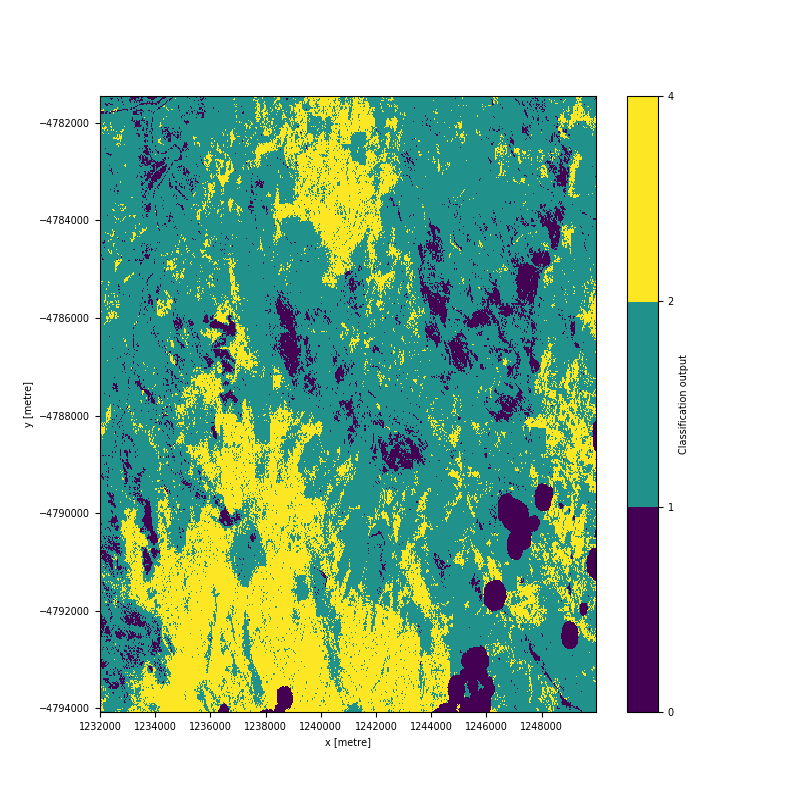

In [64]:
# Load the data for the approach of interest
analysis_xarray = data_func

# Run classification and export to file   
class_array, prob_array = randomforest_classify(classifier = classifier,
                                                analysis_data = analysis_xarray,
                                                classification_output = classification_output,
                                                class_prob = True)

# Plot output classification
class_xarray = xr.DataArray(class_array, 
                   coords = [analysis_xarray.y, analysis_xarray.x], 
                   dims = ['y', 'x'],
                   name = 'Classification output')
class_xarray.plot(levels = list(np.unique(class_array)) + [len(np.unique(class_array)) + 1], 
                  figsize = (8, 8))

<IPython.core.display.Javascript object>


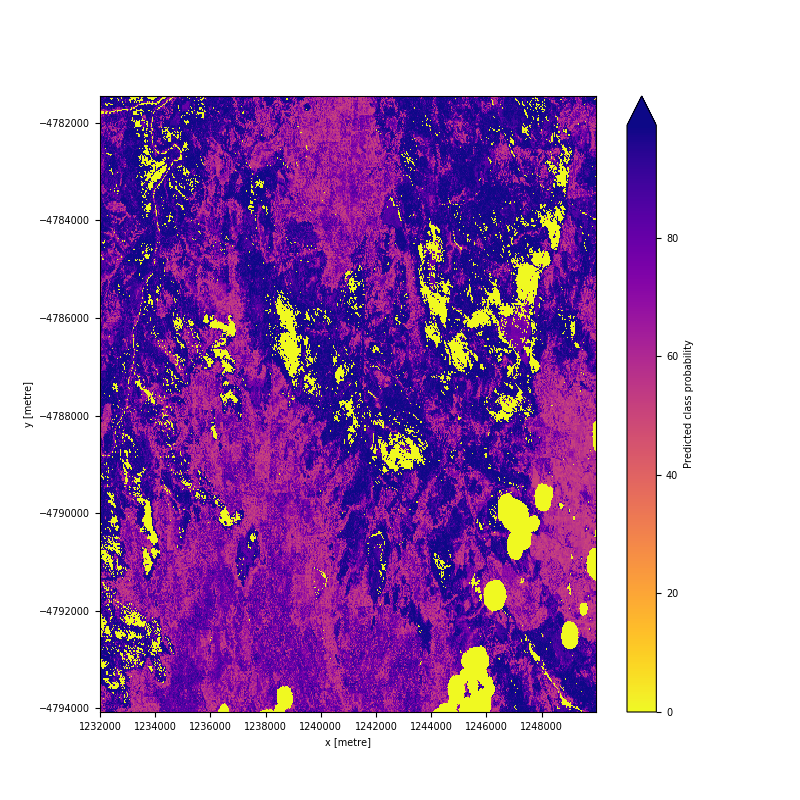

In [65]:
# Plot predicted class probability (proportion of trees agreeing with classification)
plt.plot()
prob_xarray = xr.DataArray(prob_array, 
                           coords = [analysis_xarray.y, analysis_xarray.x], 
                           dims = ['y', 'x'],
                           name = 'Predicted class probability')
prob_xarray.plot(cmap = 'plasma_r',  
                 vmin = np.percentile(prob_array, 3), 
                 vmax = np.percentile(prob_array, 97),
                 figsize = (8, 8))

/g/data/v10/public/modules/dea-env/20190709/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:338: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


<IPython.core.display.Javascript object>


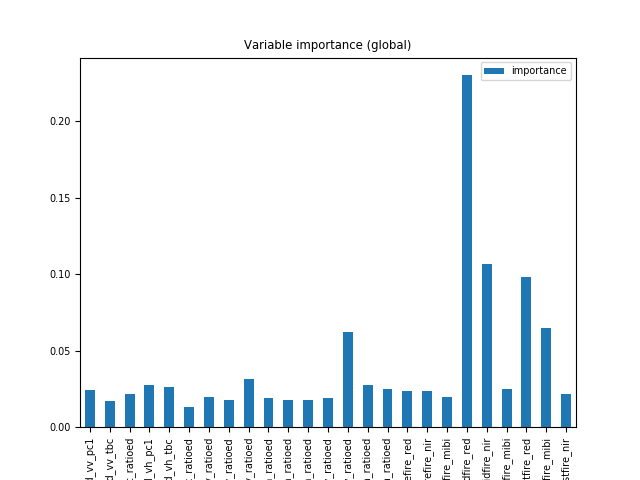

,importance
variable,
smoothed_vv_pc1,0.024174
smoothed_vv_tbc,0.017077
smoothed_vv_ic_ratioed,0.021429
smoothed_vh_pc1,0.027484
smoothed_vh_tbc,0.026450
smoothed_vh_ic_ratioed,0.012963
range_f7x_vv_ratioed,0.019477
smoothed_f7x_vv_ratioed,0.017465
range_f21x_vv_ratioed,0.031552


In [66]:
#  Extract feature importances from trained classifier
importance = classifier.feature_importances_
importance_df = pd.DataFrame({'variable': analysis_xarray.data_vars,
                              'importance': importance})
importance_df.set_index("variable", inplace = True)
importance_df.plot.bar(title = "Variable importance (global)")
display(importance_df)

# Identify and set threshold for prediction
> Instead of assuming 50% likelihood for class assignment, determine the prediction threshold statistically then perform accuracy assessment on this model

Importing training data from /home/599/mf2928/Documents/RF_SamplingTestTraining/rr_test_pts.shp:

Training random forest classifier...
Model trained on 1 bands and 156 training samples


/g/data/v10/public/modules/dea-env/20190709/lib/python3.6/site-packages/ipykernel_launcher.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


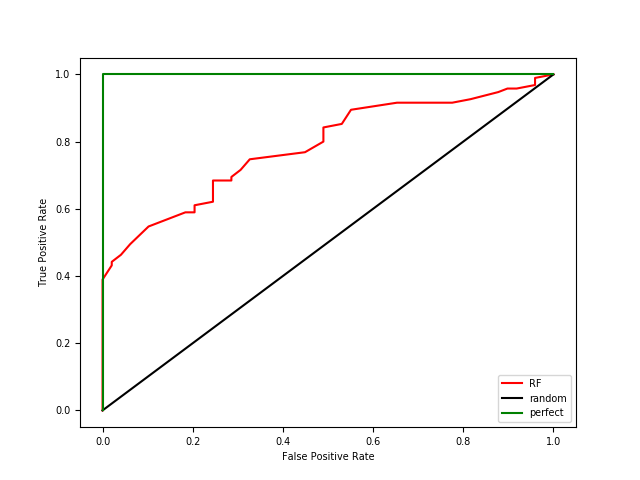

AUC score random forest:0.785


In [67]:
from sklearn.metrics import roc_curve, roc_auc_score
import matplotlib.pyplot as plt

# Use the test dataset to determine the error rates of the random forest prediction
outprob1 = prob_xarray.to_dataset()
outprob1.attrs = data_func.attrs
ignore, test_lab2, test_prob = randomforest_train2(train_shps = [firepts_test], train_field = 'class', data_func = outprob1 ,classifier_params = classifier_params, train_reclass = train_reclass)

# Remove the null value locations from the statistics
probabilities = np.concatenate(test_prob)
labels1 = test_lab2[probabilities != 0].tolist()
probabilities = probabilities[probabilities != 0].tolist()

# Convert probabilities back to decimal
myInt = 100
probabilities  = np.divide(probabilities, myInt)

# Change the labels to binary (0 = no_fire and 1=fire)
labels1 = [x if x == 1 else 0 for x in labels1]

# Run the ROC curve 
fpr_RF, tpr_RF, thresholds_RF = roc_curve(labels1, probabilities)
plt.figure(26)
plt.plot(fpr_RF, tpr_RF,'r-',label = 'RF')
plt.plot([0,1],[0,1],'k-',label='random')
plt.plot([0,0,1,1],[0,1,1,1],'g-',label='perfect')
plt.legend()
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.show()

auc_RF = roc_auc_score(labels1, probabilities)
print('AUC score random forest:%.3f'% auc_RF)

/g/data/v10/public/modules/dea-env/20190709/lib/python3.6/site-packages/ipykernel_launcher.py:12: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  if sys.path[0] == '':


<IPython.core.display.Javascript object>


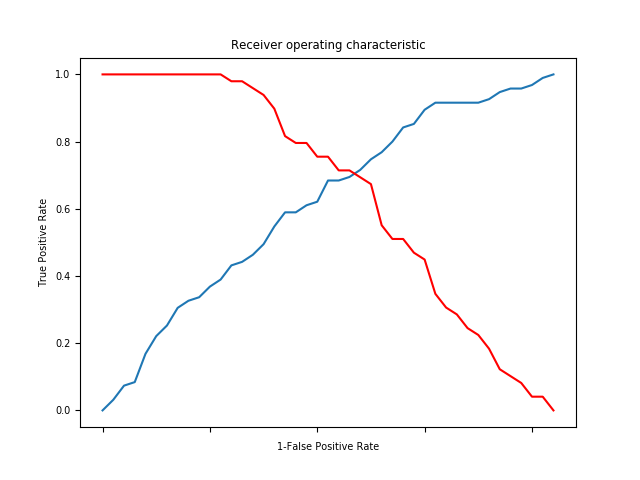

[]

In [68]:
# Plot the receiver operating characteristic to determine the optimal threshold
# Code from: https://stackoverflow.com/questions/28719067/roc-curve-and-cut-off-point-python
fpr = fpr_RF
tpr = tpr_RF
thresholds = thresholds_RF

i = np.arange(len(tpr)) # index for df
roc = pd.DataFrame({'fpr' : pd.Series(fpr, index=i),'tpr' : pd.Series(tpr, index = i), '1-fpr' : pd.Series(1-fpr, index = i), 'tf' : pd.Series(tpr - (1-fpr), index = i), 'thresholds' : pd.Series(thresholds, index = i)})
roc.ix[(roc.tf-0).abs().argsort()[:1]]

# Plot tpr vs 1-fpr
fig, ax = plt.subplots()
plt.plot(roc['tpr'])
plt.plot(roc['1-fpr'], color = 'red')
plt.xlabel('1-False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
ax.set_xticklabels([])

In [69]:
# Calculate the optimal threshold value
optimal_idx = np.argmax(tpr - fpr)
optimal_threshold = thresholds[optimal_idx]
print(f'The optimal threshold is: {optimal_threshold}')

The optimal threshold is: 0.85


In [70]:
# Set the optimal threshold and update the probability scores
probabilities[probabilities>=optimal_threshold]=1
probabilities[probabilities<1]=0

# Accuracy Assessment of model

In [71]:
# Import sklearn.metrics needed for accuracy assessments
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix

# A function that performs all the accuracy assessments and reports them

def accuracy(labels, predictions):
    
    print(f'Extended classification report: \n{classification_report(labels, predictions)}')
    print(f'Overall accuracy: {"%.3f" % accuracy_score(labels, predictions)}') 
        
    cm1 = confusion_matrix(labels,predictions)

    sensitivity1 = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    print(f'Sensitivity : {"%.3f" % sensitivity1}')

    specificity1 = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    print(f'Specificity : {"%.3f" % specificity1}')      
          
          
    return

In [72]:
# Display the accuracy assessment of the model
accuracy(labels1, probabilities)

Extended classification report: 
              precision    recall  f1-score   support

         0.0       0.51      0.90      0.65        49
         1.0       0.91      0.55      0.68        95

    accuracy                           0.67       144
   macro avg       0.71      0.72      0.67       144
weighted avg       0.77      0.67      0.67       144

Overall accuracy: 0.667
Sensitivity : 0.898
Specificity : 0.547


# Apply the new threshold to the final image and save

In [73]:
optimal_threshold = int(optimal_threshold*100)

# Change the classification values based on the threshold (nan = no data, 0 = no_fire, 1 = fire)
Finalprediction = prob_xarray.where(prob_xarray>optimal_threshold,0)
Finalprediction = Finalprediction.where(prob_xarray<=optimal_threshold,1)
Finalprediction = Finalprediction.where(prob_xarray!=0)
Finalprediction.name = 'Predicted Class'

/g/data/v10/public/modules/dea-env/20190709/lib/python3.6/site-packages/xarray/plot/utils.py:364: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  _, ax = plt.subplots(figsize=figsize)


<IPython.core.display.Javascript object>


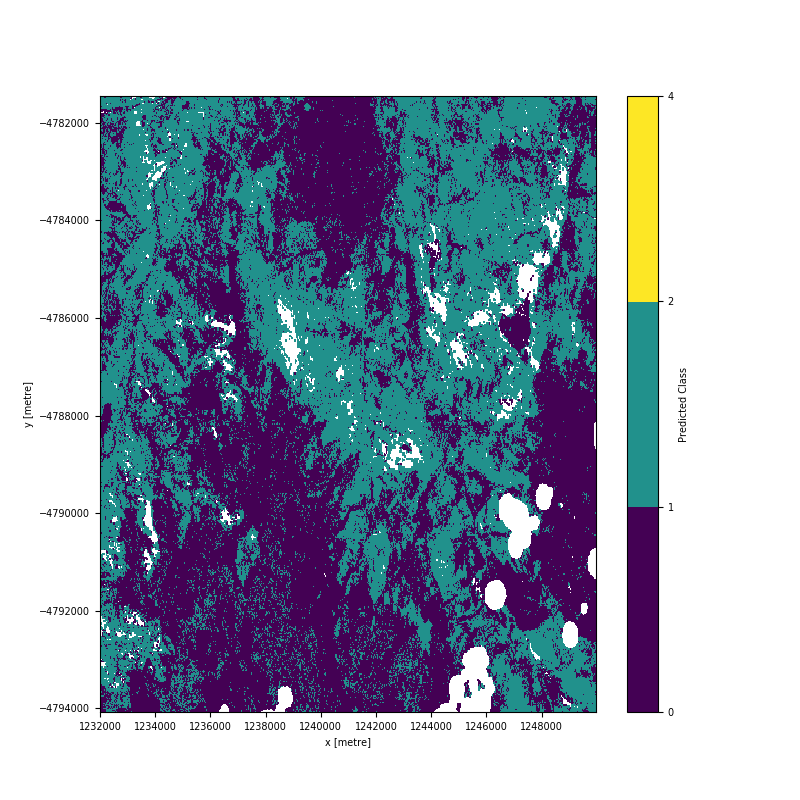

In [74]:
# Plot final predicted class probability
Finalprediction.plot(levels = list(np.unique(class_xarray)) + [len(np.unique(class_xarray))+1], 
                  figsize = (8, 8))

In [75]:
# Save the final prediction output
from os.path import splitext
array_to_geotiff(splitext(classification_output)[0] + "_finalclass.tif",
                         data=Finalprediction.values,
                         geo_transform=data_func.affine.to_gdal(),
                         projection=data_func.crs.wkt,
                         nodata_val=-999)
print("Final class image exported")

Final class image exported
